In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import time
from tqdm.notebook import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
from torch.autograd import Variable

import pickle as pkl
import random
import copy
import math
import h5py
import netCDF4 as nc

import sklearn.utils.class_weight as class_weight
torch.manual_seed(0)
random.seed(0)
np.random.seed(0)
# torch.use_deterministic_algorithms(False)
# os.environ["CUBLAS_WORKSPACE_CONFIG"]=":4096:2"
# !CUBLAS_WORKSPACE_CONFIG=:16:8

# data_dir = 'data'
# os.chdir(data_dir)
# device = 'cuda:0'

In [2]:
# !pip install --upgrade matplotlib
# !pip3 install numpy==1.23.1

In [3]:
print('Number of GPUs:', torch.cuda.device_count())
for count in range(torch.cuda.device_count()):
    print(f'\tGPU {count}:', torch.cuda.get_device_name(0))
print('Number of CPUs:', os.cpu_count())
!nvidia-smi

Number of GPUs: 0
Number of CPUs: 128
/bin/bash: nvidia-smi: command not found


# ENSO data processing: Sea Surface Temperature (SST)
* NOTE: **each SST map** is **average monthly** SST anomalies

SST map shape = (180, 360)


/tmp/ipykernel_1786495/2239687461.py:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  lons = sst_ltm_dataset.variables['lon'][:]
/tmp/ipykernel_1786495/2239687461.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  lats = sst_ltm_dataset.variables['lat'][:]
/tmp/ipykernel_1786495/2239687461.py:11: DeprecationWarning: `np.bool` is a deprecated alias

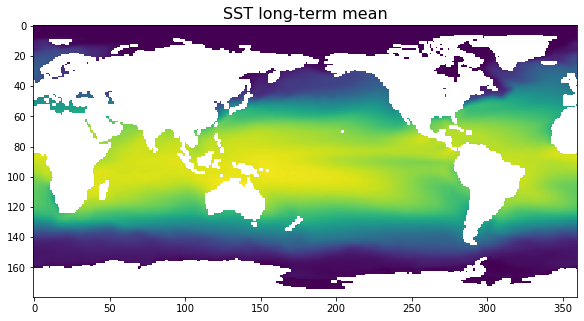

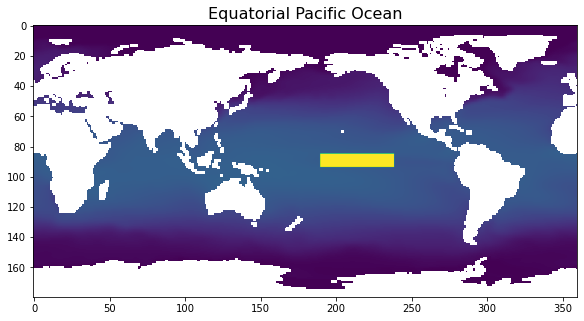

In [4]:
"""=======================================================
    Get region of interest for equatorial Pacific Ocean
======================================================="""
sst_ltm_dataset = nc.Dataset('data/sst.mon.ltm.1981-2010.nc')
lons = sst_ltm_dataset.variables['lon'][:]
lats = sst_ltm_dataset.variables['lat'][:]
""" Long-term SST data through years"""
sst_ltm_maps = sst_ltm_dataset.variables['sst']

""" Sample SST long-term map"""
sst_ltm = sst_ltm_maps[0]
print('SST map shape =', sst_ltm.shape)
plt.figure(figsize=(10,5))
plt.title('SST long-term mean', fontsize=16)
plt.imshow(sst_ltm)

"""=======================================================
    Verify Latitude/Longitude correctness
    --> visualize equatorial Pacific Ocean
        (use for Nino3.4 Index computation)
======================================================="""
minlat, maxlat = -5, 5
minlon, maxlon = 190, 240
lats_nino34 = np.where((lats >= minlat) & (lats <= maxlat))[0]
lons_nino34 = np.where((lons >= minlon) & (lons <= maxlon))[0]

sst_nino34 = sst_ltm[lats_nino34[0]:lats_nino34[-1], lons_nino34[0]:lons_nino34[-1]]
sst_ltm[lats_nino34[0]:lats_nino34[-1], lons_nino34[0]:lons_nino34[-1]] = 100
plt.figure(figsize=(10,5))
plt.title('Equatorial Pacific Ocean', fontsize=16)
plt.imshow(sst_ltm)

# Sample Composite Observation for El-Nino and La-Nina

In [5]:
"""=======================================================
    Retrieve full monthly SST observations
    * 1578 months ~ 131.5 years
    * start from Jan 01, 1891 (span to Jun 01, 2022)
======================================================="""
sst_monthly_dataset = nc.Dataset('data/sst.mon.mean.nc')
sst_monthly_maps = sst_monthly_dataset.variables['sst']
print(f'Monthly mean data shape in (#month, H, W):', sst_monthly_maps.shape)
total_samples = sst_monthly_maps.shape[0] # total months in the dataset

"""=======================================================
    Retrieve monthly long-term mean (ltm) SST observations
======================================================="""
sst_ltm_dataset = nc.Dataset('data/sst.mon.ltm.nc')
sst_ltm_maps = sst_ltm_dataset.variables['sst']
print(f'Long-term mean data shape in (#month, H, W):', sst_ltm_maps.shape)

"""=======================================================
    Record all monthly SST observations associated 
    with El-Nino and La-Nina
======================================================="""
SST_anomalies_ElNino = []
SST_anomalies_LaNina = []

for sample in tqdm(range(total_samples), position=0):
    # 1. Retrieve monthly mean SST
    sst = sst_monthly_maps[sample]
    # 2. Retrieve long-term mean SST based on current month
    month = sample % 12
    sst_ltm = sst_ltm_maps[month]
    # 3. Get SST anomalies
    sst_anomalies = sst - sst_ltm
    
    # 4. Focus on SST anomalies at equatorial Pacific Ocean
    #    --> this is to compute Nino3.4 index
    ROI_sst_anomalies = sst_anomalies[lats_nino34[0]:lats_nino34[-1], lons_nino34[0]:lons_nino34[-1]]
    
    # 5. Compute Nino3.4 Index
    nino34_index = np.mean(ROI_sst_anomalies)
    
    # 6. Record La-Nina / El-Nino SSTs based on Nino3.4 Index
    if(nino34_index < -0.5):
        SST_anomalies_LaNina.append(sst_anomalies)
    elif(nino34_index > 0.5):
        SST_anomalies_ElNino.append(sst_anomalies)
        
print(f'Total El Nino cases: {len(SST_anomalies_ElNino)}.')
print(f'Total La Nina cases: {len(SST_anomalies_LaNina)}.')

Monthly mean data shape in (#month, H, W): (1578, 180, 360)
Long-term mean data shape in (#month, H, W): (12, 180, 360)


  0%|          | 0/1578 [00:00<?, ?it/s]

/tmp/ipykernel_1786495/3976949507.py:27: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  sst = sst_monthly_maps[sample]
/tmp/ipykernel_1786495/3976949507.py:30: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  sst_ltm = sst_ltm_maps[month]


Total El Nino cases: 257.
Total La Nina cases: 531.


In [6]:
print(sst_ltm_maps.shape)

(12, 180, 360)


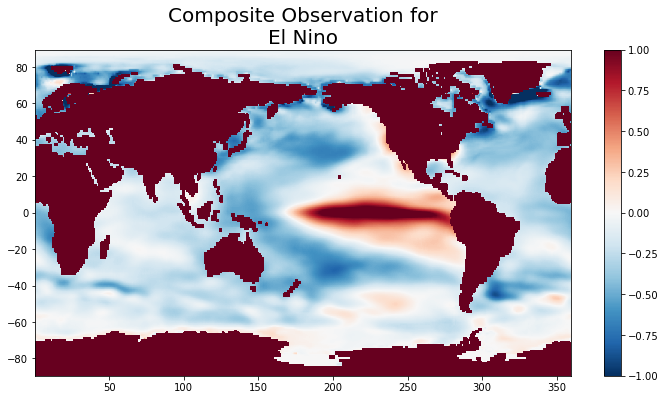

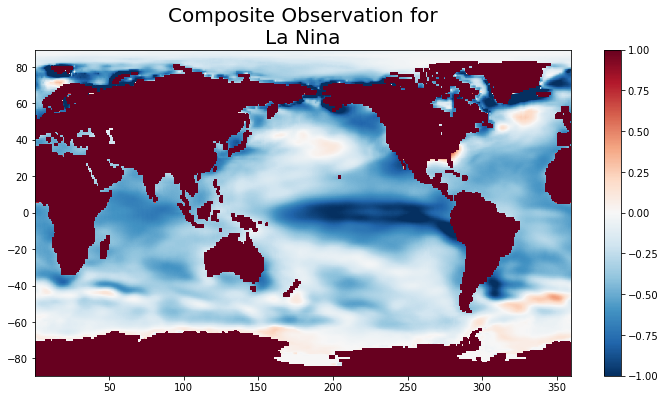

In [7]:
from matplotlib import colors

"""=======================================================
    Visualize El-Nino / La-Nina composite SST anomalies
======================================================="""
ElNino_composite = np.mean(np.array(SST_anomalies_ElNino), axis=0)
LaNina_composite = np.mean(np.array(SST_anomalies_LaNina), axis=0)

norm = colors.TwoSlopeNorm(vmin=-1, vcenter=0., vmax=1)

plt.figure(figsize=(12,6))
plt.title('Composite Observation for\nEl Nino', fontsize=20)
plt.imshow(ElNino_composite, cmap='RdBu_r', 
           norm=norm, aspect='auto',
           extent=[lons.min(), lons.max(), lats.min(), lats.max()])
plt.colorbar()

plt.figure(figsize=(12,6))
plt.title('Composite Observation for\nLa Nina', fontsize=20)
plt.imshow(LaNina_composite, cmap='RdBu_r', 
           norm=norm, aspect='auto',
           extent=[lons.min(), lons.max(), lats.min(), lats.max()])
plt.colorbar()

In [9]:
print(img.min(), img.max())
# print(sst_monthly_dataset.variables['time'])
print(type(img))
print(img)

NameError: name 'img' is not defined

# Label ENSO dataset
* Index 0: **Nino3.4 < -0.5 (La Nina)**
* Index 1: **Nino3.4 >  0.5 (El Nino)**
* Else: discard

In [8]:
SST_anomalies_all = []
train_ElNino = []
train_LaNina = []
test_ElNino = []
test_LaNina = []
land_mask = None
mask_val = -9 # mask value after being masked out

"""=======================================================
        Land Mask (exclude lands from SST observations)
======================================================="""
land_mask = sst_monthly_maps[0].mask
land_mask = (land_mask == False).astype(float)

"""=======================================================
        Train/Test SST anomalies maps for 
        El-Nino and La-Nina cases
======================================================="""
for sample in tqdm(range(total_samples), position=0):
    # 1. Get monthly mean SST
    sst = sst_monthly_maps[sample]
    # 2. Get long-term mean SST
    month = sample % 12
    sst_ltm = sst_ltm_maps[month]
    
    # 3. Compute SST anomalies
    sst_anomalies = sst - sst_ltm
    sst_anomalies = np.array(sst_anomalies.data)
    # 3.1. Mask all lands in SST maps as -20
    sst_anomalies = sst_anomalies * land_mask + (mask_val)*(land_mask == False).astype(float)
    SST_anomalies_all.append(sst_anomalies)
    
    # 4. Focus on SST anomalies at equatorial Pacific Ocean
    #    --> this is to compute Nino3.4 index
    ROI_sst_anomalies = sst_anomalies[lats_nino34[0]:lats_nino34[-1], lons_nino34[0]:lons_nino34[-1]]
    
    # 5. Compute Nino3.4 Index
    nino34_index = np.mean(ROI_sst_anomalies)
    
    # 6. Labeling process
    if(nino34_index < -0.5):
        if(sample < int(total_samples*0.8)):
            train_LaNina.append(sst_anomalies)
        else:
            test_LaNina.append(sst_anomalies)
    elif(nino34_index > 0.5):
        if(sample < int(total_samples*0.8)):
            train_ElNino.append(sst_anomalies)
        else:
            test_ElNino.append(sst_anomalies)

print('Total training samples for El Nino:', len(train_ElNino))
print('Total testing samples for El Nino:', len(test_ElNino))
print('Total training samples for La Nina:', len(train_LaNina))
print('Total testing samples for El Nino:', len(test_LaNina))

/tmp/ipykernel_1786495/266736491.py:12: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  land_mask = sst_monthly_maps[0].mask


  0%|          | 0/1578 [00:00<?, ?it/s]

/tmp/ipykernel_1786495/266736491.py:21: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  sst = sst_monthly_maps[sample]
/tmp/ipykernel_1786495/266736491.py:24: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  sst_ltm = sst_ltm_maps[month]


Total training samples for El Nino: 185
Total testing samples for El Nino: 72
Total training samples for La Nina: 423
Total testing samples for El Nino: 108


In [9]:
"""=======================================================
        Final Training / Testing sets
======================================================="""
trainset = train_ElNino + train_LaNina
testset = test_ElNino + test_LaNina
train_labels = [1 for i in range(len(train_ElNino))] + [0 for i in range(len(train_LaNina))]
test_labels = [1 for i in range(len(test_ElNino))] + [0 for i in range(len(test_LaNina))]

assert len(trainset) == len(train_labels)
assert len(testset) == len(test_labels)
assert (np.array(train_labels) == 1).sum() == len(train_ElNino)
assert (np.array(train_labels) == 0).sum() == len(train_LaNina)
assert (np.array(test_labels) == 1).sum() == len(test_ElNino)
assert (np.array(test_labels) == 0).sum() == len(test_LaNina)

"""=======================================================
        One-hot-encoded targets
======================================================="""
train_labels = np.array(train_labels)
test_labels = np.array(test_labels)
train_labels_onehot = train_labels.astype(int)
test_labels_onehot = test_labels.astype(int)

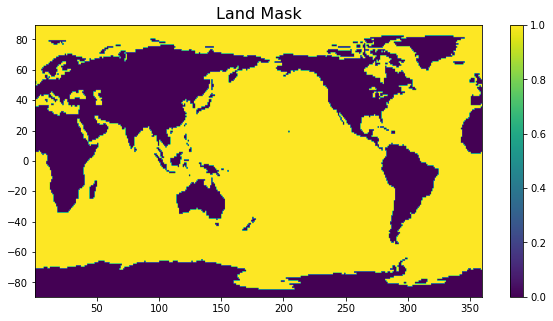

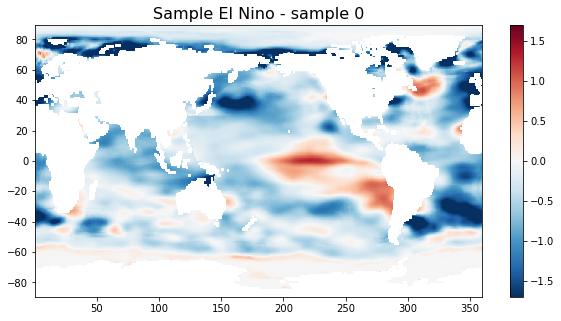

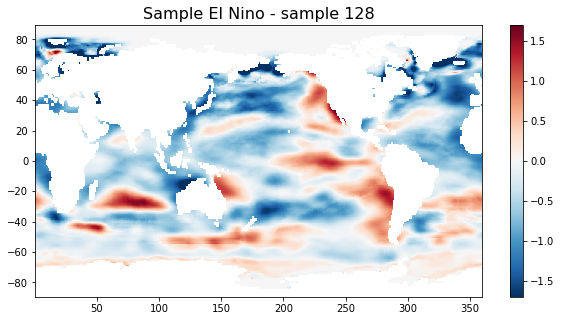

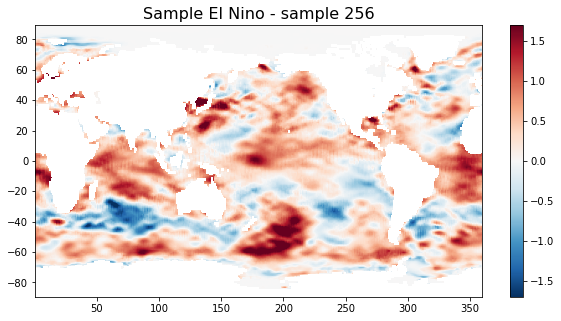

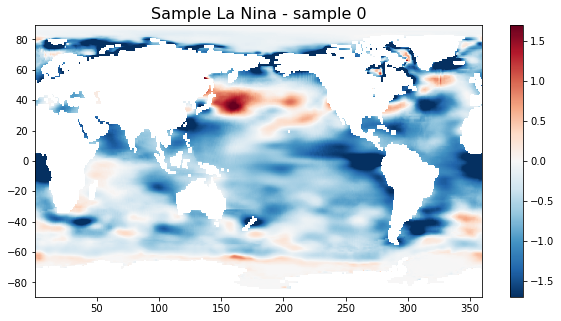

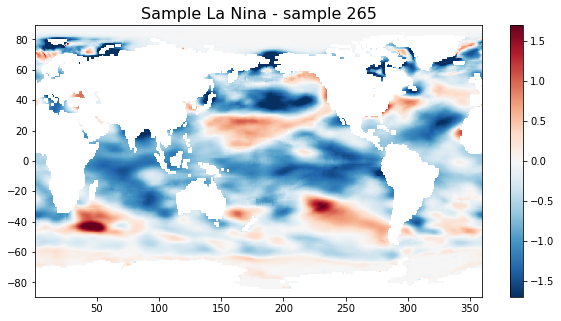

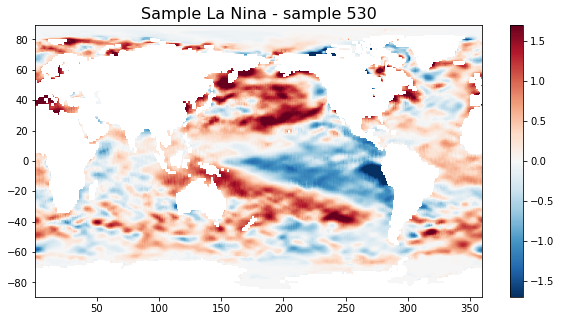

In [10]:
"""=======================================================
    Land Mask Visualization
======================================================="""
plt.figure(figsize=(10,5))
plt.title(f'Land Mask', fontsize=16)
plt.imshow(land_mask, aspect='auto', cmap='viridis', 
           extent=[lons.min(), lons.max(), lats.min(), lats.max()])
plt.colorbar()

"""=======================================================
    ENSO Case-by-case Visualization
======================================================="""
norm = colors.TwoSlopeNorm(vmin=-1.7, vcenter=0., vmax=1.7)

""" El Nino"""
for idx in range(0, len(SST_anomalies_ElNino), len(SST_anomalies_ElNino)//2):
    img = SST_anomalies_ElNino[idx]

    plt.figure(figsize=(10,5))
    plt.title(f'Sample El Nino - sample {idx}', fontsize=16)
    plt.imshow(img, cmap='RdBu_r', norm=norm, aspect='auto', 
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    plt.colorbar()

""" La Nina"""
for idx in range(0, len(SST_anomalies_LaNina), len(SST_anomalies_LaNina)//2):
    img = SST_anomalies_LaNina[idx]

    plt.figure(figsize=(10,5))
    plt.title(f'Sample La Nina - sample {idx}', fontsize=16)
    plt.imshow(img, cmap='RdBu_r', norm=norm, aspect='auto', 
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    plt.colorbar()

# conv = nn.Conv2d(1, 8, kernel_size=3)
# img = np.array([img])
# img = torch.Tensor(img)
# print(img.shape)

In [11]:
# train_idx = [i for i in range(len(trainset))]
# random.shuffle(train_idx)
# trainset_run = [trainset[idx] for idx in train_idx]
# train_labels_run = [train_labels[idx] for idx in train_idx]
# print(train_labels_run)

# test_idx = [i for i in range(len(testset))]

# Models definition

In [11]:
class CNN4(nn.Module):
    def __init__(self):
        super().__init__()
        self.downsample = F.interpolate
        self.conv1 = nn.Conv2d(1, 8, (5,5), stride=(1,1))
        self.conv2 = nn.Conv2d(8, 16, (5,5), stride=(1,1))
        self.conv3 = nn.Conv2d(16, 32, (5,5), stride=(1,1))
        self.pool1 = nn.MaxPool2d((2,2), stride=2)
        self.conv4 = nn.Conv2d(32, 64, (5,5), stride=(1,1))
        self.pool2 = nn.MaxPool2d((2,2), stride=2)
        self.dropout = nn.Dropout2d(p=0.3)
        self.classifier = nn.Sequential(
                            nn.Linear(6528, 256),
                            nn.Linear(256,1), 
                            nn.Sigmoid())

    def forward(self, x):
        x = self.downsample(x, scale_factor=1/4, mode='bicubic', align_corners=False)
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = self.pool1(x)
        x = F.relu(self.conv4(x))
        x = self.pool2(x)
        x = self.dropout(x)
        x = x.view(x.shape[0],-1)
        x = self.classifier(x)
        x = x.view(-1)

        return x
    
class LeNet5(nn.Module):
    def __init__(self):
        super(LeNet5, self).__init__()
        
        self.feature_extractor = nn.Sequential(            
            nn.Conv2d(in_channels=1, out_channels=16, kernel_size=5, stride=1),
            nn.Tanh(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=5, stride=1),
            nn.Tanh(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=5, stride=1),
            nn.Tanh(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=5, stride=1),
            nn.Tanh()
        )

        self.classifier = nn.Sequential(
            nn.Linear(in_features=8880, out_features=64),
            nn.Tanh(),
            nn.Linear(in_features=64, out_features=1),
            nn.Sigmoid()
        )


    def forward(self, x):
        x = self.feature_extractor(x)
        x = x.view(x.shape[0], -1)
        logits = self.classifier(x)
        # logits = logits.view(-1)
        return logits
    
class MLP(nn.Module):
    def __init__(self, n_features, n_classes):
        super(MLP, self).__init__()
        self.classifier = nn.Sequential(
            nn.Linear(in_features=n_features, out_features=8),
            nn.ReLU(),
            nn.Linear(in_features=8, out_features=8),
            nn.ReLU(),
            nn.Linear(in_features=8, out_features=n_classes)
        )


    def forward(self, x):
        logits = self.classifier(x)
        logits = torch.sigmoid(logits)
        return logits

    
class logisticRegression(nn.Module):
    def __init__(self):
        super().__init__()
        self.classifier = nn.Linear(5461, 2)

    def forward(self, x):
        x = torch.reshape(x, (x.shape[0], -1))
        x = self.classifier(x)

        return x
    
def init_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)
        if(m.bias is not None):
            m.bias.data.fill_(0.001)

In [12]:
class ChannelAttention(nn.Module):
    def __init__(self, in_channels, hidden_ratio=8):
        super(ChannelAttention, self).__init__()
        
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.fc = nn.Sequential(nn.Conv2d(in_channels, in_channels // hidden_ratio, 1, bias=False),
                               nn.ReLU(),
                               nn.Conv2d(in_channels // hidden_ratio, in_channels, 1, bias=False))
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc(self.avg_pool(x))
        max_out = self.fc(self.max_pool(x))
        out = avg_out + max_out
        return self.sigmoid(out)

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()

        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=kernel_size//2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)
    
class AttentionNet(nn.Module):
    def __init__(self, mask, device='cpu'):
        super(AttentionNet, self).__init__()
        self.downscale_factor = 1/8
        
        """ Land mask: original 2D size"""
        self.mask = torch.Tensor(mask)[None, None, :, :].to(device)
        """ Land mask: downscaled 2D size"""
        self.mask_dscale = F.interpolate(self.mask, mode='nearest',
                                         scale_factor = self.downscale_factor)
        self.mask_dscale = (self.mask_dscale > 0.5).int()
        
        self.convblock1 = nn.Sequential(            
            nn.Conv2d(in_channels=1, out_channels=16, kernel_size=5, stride=1, padding='same'),
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=5, stride=1, padding='same'),
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=5, stride=1, padding='same'),
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=5, stride=1, padding='same'),
            nn.ReLU(),
        )
        self.ca = ChannelAttention(in_channels=16)
        self.sa = SpatialAttention()

        self.classifier = nn.Sequential(
            nn.Linear(in_features=15840, out_features=128),
            nn.Tanh(),
            nn.Linear(in_features=128, out_features=1),
            nn.Sigmoid()
        )
        
    def get_spatial_attn(self, x):
        x = self.convblock1(x)
        x = self.ca(x) * x
        out = self.sa(x) * self.mask_dscale
        # spatial attn shape is [N, 1, H, W]
        out = torch.mean(out, axis=1)
        return out


    def forward(self, x):
        x = self.convblock1(x)
        x = self.ca(x) * x
        x = (self.sa(x) * self.mask_dscale) * x
        x = x.view(x.shape[0], -1)
        logits = self.classifier(x)
        # logits = logits.view(-1)
        return logits

Prediction shape -> torch.Size([16, 1])
Attention map shape -> (180, 360)


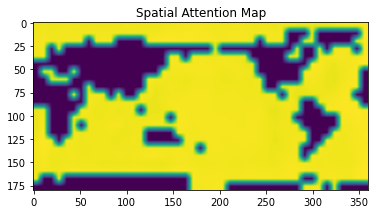

In [13]:
img = np.array(trainset[:16])
img = torch.Tensor(img)
img = img[:, None, :, :]

model = AttentionNet(mask=land_mask)
preds = model(img)
print('Prediction shape ->', preds.shape)
attn = model.get_spatial_attn(img)
attn = attn[:,None,:,:]
attn = F.interpolate(attn, size=(180,360), mode='bilinear')
attn = attn[0,0,:,:]
attn = attn.detach().cpu().numpy()
print('Attention map shape ->', attn.shape)

plt.figure()
plt.title('Spatial Attention Map')
plt.imshow(attn)

In [14]:
# img = trainset[:16]
# img = torch.Tensor(img)
# img = img[:, None, :, :]
# print(img.min(), img.max())
# print(img.shape)

# mask = torch.Tensor(land_mask)[None, None, :, :]

# downsample = F.interpolate

# conv1 = nn.Conv2d(1, 8, kernel_size=5, padding='same')
# conv2 = nn.Conv2d(8, 16, kernel_size=5, padding='same')
# pool1 = nn.MaxPool2d((2,2), stride=2)

# conv3 = nn.Conv2d(16, 8, kernel_size=5, padding='same')
# conv4 = nn.Conv2d(8, 1, kernel_size=5, padding='same')
# pool2 = nn.MaxPool2d((2,2), stride=2)


# x = img
# x = downsample(x, size=(x.shape[2]//4, x.shape[3]//4), mode='bilinear', align_corners=False)

# h = conv1(x)
# h = conv2(h)
# h = pool1(h)
# print(h.shape)
# h = conv3(h)
# h = conv4(h)
# h = pool2(h)
# print(h.shape)

# h = h.view(h.shape[0], h.shape[1], -1)
# h = torch.sum(h, axis=-1)
# out = torch.sigmoid(h)
# print(out.shape)

In [15]:
class ExponentialUnit(nn.Module):
    def __init__(self):
        super(ExponentialUnit, self).__init__()
    
    def forward(self, x):
        return torch.exp(x)

"""=====================================
        Attention-based
====================================="""
# class AttentionCNN(nn.Module):
    
"""=====================================
        Base-CNN
====================================="""
class CNN(nn.Module):
    def __init__(self, spatial_shape, mask, device='cpu'):
        super(CNN, self).__init__()
        self.downscale_factor = 1/8
        
        """ Land mask: original 2D size"""
        self.mask = torch.Tensor(mask)[None, None, :, :].to(device)
        """ Land mask: downscaled 2D size"""
        self.mask_dscale = F.interpolate(self.mask, mode='nearest',
                                         scale_factor = self.downscale_factor)
        self.mask_dscale = (self.mask_dscale > 0.5).int()
        
        """ Convolution reduce X dimension by (8 x 8)"""
        self.spatial_extractor = nn.Sequential(
                                      nn.Conv2d(1, 8, kernel_size=5, dilation=1, padding='same'), 
                                      nn.Conv2d(8, 8, kernel_size=5, dilation=1, padding='same'), 
                                      nn.ReLU(), 
                                      nn.MaxPool2d((2,2), stride=2),
                                      nn.Conv2d(8, 16, kernel_size=5, dilation=1, padding='same'),
                                      nn.Conv2d(16, 16, kernel_size=5, dilation=1, padding='same'),
                                      nn.ReLU(),
                                      nn.MaxPool2d((2,2), stride=2), 
                                      nn.Conv2d(16, 16, kernel_size=5, dilation=1, padding='same'),
                                      nn.Conv2d(16, 16, kernel_size=5, dilation=1, padding='same'),
                                      nn.ReLU(),
                                      nn.MaxPool2d((2,2), stride=2), 
                                      nn.Conv2d(16, 8, kernel_size=5, dilation=1, padding='same'),
                                      nn.Conv2d(8, 1, kernel_size=5, dilation=1, padding='same'),
                                      nn.ReLU(),
                                      # ExponentialUnit(),
                                      nn.Dropout(p=0.2))
        
        """ MLP layer"""
        self.num_features = int(spatial_shape[0] * self.downscale_factor) * \
                            int(spatial_shape[1] * self.downscale_factor)
        self.mlp = nn.Sequential(nn.Linear(self.num_features, 32), nn.ReLU(), 
                                 nn.Linear(32,1))
        
    def forward(self, x):
        """# 1. Convolutional layers"""
        h = self.spatial_extractor(x)
        h = self.mask_dscale * h
        """# 2. Unroll 2D -> 1D"""
        h = h.view(h.shape[0], -1)
        """# 3. MLP layer"""
        out = self.mlp(h)
        out = torch.sigmoid(out)
        out = out.view(-1)
        
        return out

"""=====================================
        NA-CNN: Neural Additive CNN
====================================="""
class NeuralAdditiveCNN(nn.Module):
    def __init__(self, spatial_shape, mask, interpolation=1/2, device='cpu'):
        super(NeuralAdditiveCNN, self).__init__()
        self.interpolation = interpolation
        self.downscale_factor = interpolation * 1/4
        
        """ Land mask: original 2D size"""
        self.mask = torch.Tensor(mask)[None, None, :, :].to(device)
        """ Land mask: downscaled 2D size"""
        self.mask_dscale = F.interpolate(self.mask, mode='nearest',
                                         scale_factor = self.downscale_factor)
        self.mask_dscale = (self.mask_dscale > 0.5).int()
        
        """ Convolution reduce X dimension by (8 x 8)"""
        self.downsample = F.interpolate
        self.spatial_extractor = nn.Sequential(
                                      nn.Conv2d(1, 8, kernel_size=5, dilation=1, padding='same'), 
                                      nn.Conv2d(8, 8, kernel_size=5, dilation=1, padding='same'), 
                                      nn.ReLU(), 
                                      nn.MaxPool2d((2,2), stride=2),
                                      nn.Conv2d(8, 8, kernel_size=5, dilation=1, padding='same'),
                                      nn.Conv2d(8, 8, kernel_size=5, dilation=1, padding='same'),
                                      nn.ReLU(),
                                      nn.MaxPool2d((2,2), stride=2), 
                                      # ExponentialUnit(),
                                      nn.Dropout(p=0.7))
        
        """ Feature net"""
        self.num_features = int(spatial_shape[0] * self.downscale_factor) * \
                            int(spatial_shape[1] * self.downscale_factor)
        self.featureNet = nn.ModuleDict({})
        for num in range(self.num_features):
            self.featureNet[f'FeatureNet {num}'] = nn.Sequential(nn.Linear(8, 32), nn.ReLU(), 
                                                                 nn.Dropout(p=0.2),
                                                                 nn.Linear(32, 32), nn.ReLU(), 
                                                                 nn.Linear(32, 1, bias=False))
        
        self.add_bias = nn.Parameter(torch.Tensor([0.]))

    def latent_presigmoid(self, x):
        """# 1. Downsampling"""
        x = self.downsample(x, scale_factor=self.interpolation, 
                            mode='bilinear', align_corners=False)
        
        """# 2. Convolutional layers"""
        h = self.spatial_extractor(x)
        """# 3. Unroll 2D -> 1D"""
        h = h.view(h.shape[0], h.shape[1], -1)
        
        """# 4. Feature Net"""
        feature_stack = []
        for num in range(self.num_features):
            latent = self.featureNet[f'FeatureNet {num}'](h[:,:, num])
            feature_stack.append(latent)
        feature_stack = torch.stack(feature_stack, axis=-1)
        
        """# 5. Neural Additive CNN -> interpretation here"""
        out = feature_stack[:,0,:]
        
        """# 6. Mask out land regions -> suppress weight to 0
           #    sigmoid(0) = 0.5 -> 0 is not discriminative"""
        mask_flatten = self.mask_dscale.view(-1)
        out = out * mask_flatten
        
        return out
        
    def forward(self, x):
        """# 1. Obtain latent representation from convolution & feature net"""
        h = self.latent_presigmoid(x)
        """# 2. Neural Additive Model + bias"""
        out = torch.sum(h, axis=-1) + self.add_bias
        out = torch.sigmoid(out)
        out = out.view(-1)
        
        return out

"""=====================================
        NA-FCN: Neural Additive FCN
====================================="""
class NeuralAdditiveFCN(nn.Module):
    def __init__(self, spatial_shape, mask, device='cpu'):
        super(NeuralAdditiveFCN, self).__init__()
        self.downscale_factor = 1/8
        
        """ Land mask: original 2D size"""
        self.mask = torch.Tensor(mask)[None, None, :, :].to(device)
        """ Land mask: downscaled 2D size"""
        self.mask_dscale = F.interpolate(self.mask, mode='nearest',
                                         scale_factor = self.downscale_factor)
        self.mask_dscale = (self.mask_dscale > 0.5).int()
        
        """ Convolution reduce X dimension by (8 x 8)"""
        self.spatial_extractor = nn.Sequential(
                                      nn.Conv2d(1, 8, kernel_size=5, dilation=1, padding='same'), 
                                      nn.Conv2d(8, 8, kernel_size=5, dilation=1, padding='same'), 
                                      nn.ReLU(), 
                                      nn.MaxPool2d((2,2), stride=2),
                                      nn.Conv2d(8, 16, kernel_size=5, dilation=1, padding='same'),
                                      nn.Conv2d(16, 16, kernel_size=5, dilation=1, padding='same'),
                                      nn.ReLU(),
                                      nn.MaxPool2d((2,2), stride=2), 
                                      nn.Conv2d(16, 16, kernel_size=5, dilation=1, padding='same'),
                                      nn.Conv2d(16, 16, kernel_size=5, dilation=1, padding='same'),
                                      nn.ReLU(),
                                      nn.MaxPool2d((2,2), stride=2), 
                                      nn.Conv2d(16, 8, kernel_size=5, dilation=1, padding='same'),
                                      nn.Conv2d(8, 1, kernel_size=5, dilation=1, padding='same'),
                                      nn.ReLU(),
                                      # ExponentialUnit(),
                                      nn.Dropout(p=0.2))
        
        """ Grid weights"""
        self.num_features = int(spatial_shape[0] * self.downscale_factor) * \
                            int(spatial_shape[1] * self.downscale_factor)
        self.grid_weights = nn.Parameter(torch.zeros(self.num_features))
        
        """ Additive bias"""
        self.add_bias = nn.Parameter(torch.Tensor([0.]))

    def latent_presigmoid(self, x):
        """# 1. Convolutional layers"""
        h = self.spatial_extractor(x)
        """# 2. Unroll 2D -> 1D"""
        h = h.view(h.shape[0], -1)
        
        """# 3. Grid weights -> interpretation here"""
        out = self.grid_weights * h
        
        """# 4. Mask out land regions -> suppress weight to 0
           #    sigmoid(0) = 0.5 -> 0 is not discriminative"""
        mask_flatten = self.mask_dscale.view(-1)
        out = out * mask_flatten
        
        return out
        
    def forward(self, x):
        """# 1. Obtain latent representation from convolution & feature net"""
        h = self.latent_presigmoid(x)
        """# 2. Neural Additive Model + bias"""
        out = torch.sum(h, axis=-1) + self.add_bias
        out = torch.sigmoid(out)
        out = out.view(-1)
        
        return out

img = np.array(trainset[:16])
img = torch.Tensor(img)
img = img[:, None, :, :]

# model = NeuralAdditiveCNN(spatial_shape=(180,360), 
#                           mask=land_mask, 
#                           interpolation=1)
model = NeuralAdditiveFCN(spatial_shape=(180,360), 
                          mask=land_mask, device='cpu')
preds = model(img)
print(preds)

tensor([0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000,
        0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000],
       grad_fn=<ViewBackward0>)


In [16]:
# x = torch.rand((64,3,55,100))
# model = CNN4()
# model(x).shape

# x = torch.rand((64, 43799))
# model = MLP(43799, 2)
# model(x).shape

# nn.ModuleDict({})
# h[:, num]

# TRAIN: Training process (Label loading & Dataset preparation included)

In [17]:
""" Retrieve Binary Mask and Data """
MASK = SST_anomalies_ElNino[0].mask
num_features = trainset[0][MASK==False].shape[0]

In [18]:
# """
#     NOTE: Remember to turn normalization back on!
# """

# from itertools import product
# MODEL_TYPE = 'neural-additive-cnn'
# MODEL_TYPE = 'CNN4'

# """
#     ===============================================
#                 1. Model initialization
#     ===============================================
# """
# if(MODEL_TYPE == 'neural-additive-cnn'):
#     model = NeuralAdditiveCNN(mask=land_mask)
# elif(MODEL_TYPE == 'CNN4'):
#     model = CNN4()
# elif(MODEL_TYPE == 'mlp'):
#     model = MLP(num_features, 2)
# elif(MODEL_TYPE == 'linear'):
#     model = logisticRegression()

# device = 'cpu'
# model.apply(init_weights)
# model = model.to(device)
# print('Initialization done.')

# """
#     ===============================================
#                 2. Training hyperparamters
#     ===============================================
# """
# NUM_EPOCHS = 100
# bs = 16
# lr = 0.00001 if('vgg' in MODEL_TYPE) else 0.001
# optimizer = torch.optim.Adam(model.parameters(), lr=lr)
# class_weights = class_weight.compute_class_weight('balanced', np.unique(train_labels), train_labels)
# class_weights = torch.Tensor(class_weights).to(device)
# criterion = nn.BCELoss()


# """
#     ===============================================
#                 3. Training process
#     ===============================================
# """
# num_epochs_plateu = 0
# best_accuracy = 0.0
# best_newMetric = 0.0
# best_train_loss = 999999999
# save_model_train_loss = 9999999

# random.seed(0)
# train_indexes = [i for i in range(len(trainset))]
# test_indexes = [i for i in range(len(testset)) ]

# for epoch in range(NUM_EPOCHS):
#     """
#         Training Stochastic batch gradient descent
#         -> Stochastic -> randomly sampled data -> shuffle
#     """
#     model.train()
#     total_loss=0
#     random.shuffle(train_indexes)

#     # Traverse through train indexes with step=bs
#     for start_idx in tqdm(range(0, len(train_indexes), bs), position=0, desc=f'Training Epoch {epoch}: '):
#         batch_indexes = train_indexes[start_idx : min(start_idx+bs, len(train_indexes))]
#         batch_arr = []

#         # Traverse through the images in batch 
#         # Preprocessing are done in this snippet
#         for img_idx in batch_indexes:
#             data = trainset[img_idx]     
#             batch_arr.append(data)
#         batch_arr = np.array(batch_arr)

#         # Training process
#         batch_arr = torch.Tensor(batch_arr)
#         batch_arr = batch_arr[:,None,:,:].to(device)
#         targets   = torch.Tensor(train_labels_onehot[batch_indexes]).to(device)
#         targets = torch.reshape(targets, (-1, 1))
#         outputs = model(batch_arr)
#         outputs = torch.reshape(outputs, (-1, 1))
        
#         optimizer.zero_grad()
#         loss = criterion(outputs, targets)
#         loss.backward()
#         optimizer.step()
#         total_loss += loss

#     """
#         Testing Process
#     """
#     model.eval()
#     with torch.no_grad():
#         test_correct_count = 0.0
#         TP = 0.0                # True Positives
#         TN = 0.0                # True Negatives
#         count_gt_positive = 0.0 # groud-truth blocking events
#         count_gt_negative = 0.0 # groud-truth non-blocking events
#         count_pred_positive = 0.0 # predicted blocking events
#         for start_idx in tqdm(range(0, len(test_indexes), bs), position=0, desc=f'Epoch {epoch} - Evaluation: '):
#             batch_indexes = test_indexes[start_idx : min(start_idx+bs, len(test_indexes))]
#             batch_arr = []
#             for img_idx in batch_indexes:
#                 data = testset[img_idx]
#                 batch_arr.append(data)
#             batch_arr = np.array(batch_arr)

#             # Inference process
#             batch_arr = torch.Tensor(batch_arr)
#             batch_arr = batch_arr[:,None,:,:].to(device)
#             outputs = model(batch_arr)
#             predictions = outputs
#             targets   = torch.Tensor(test_labels_onehot[batch_indexes]).to(device)
#             test_correct_count += float(torch.sum(predictions==targets))
#             count_gt_positive += (targets==1).sum()
#             count_gt_negative += (targets==0).sum()
#             TP += float(torch.sum(predictions*targets)) # element-wise product
#             TN += float(torch.sum((predictions==0)*(targets==0))) # element-wise product

#     """
#         Update best accuracy and log them into the screen
#     """
#     FN = count_gt_positive - TP
#     FP = count_gt_negative - TN
#     val_accuracy = float(test_correct_count / len(test_indexes))
#     TPR = float(TP / count_gt_positive)
#     TPR = max(TPR, 0.0001) # avoid divisible by 0
#     TNR = float(TN / count_gt_negative)
#     TNR = max(TNR, 0.0001) # avoid divisible by 0
#     MCC = None # (TP*TN-FP*FN) / math.sqrt((TP+FP)*(TP+FN)*(TN+FP)*(TN+FN))
#     newMetric = (2*TPR*TNR)  / (TPR + TNR)
#     print(f"Epoch: {epoch}, MCC = {MCC}, Main metric = {newMetric}, TPR = {TPR}, TNR = {TNR}")
#     print(f"Epoch: {epoch}, train loss: {total_loss}, val accuracy {val_accuracy}")
    
#     if(epoch == 0 or best_newMetric < newMetric):
#         if(best_newMetric < newMetric):
#             best_newMetric = newMetric
#         torch.save(model, f'./main_models_original/ENSO_{MODEL_TYPE}.pt')

#     """
#         Control learning rate and early stopping
#     """
#     if(total_loss < best_train_loss):
#         best_train_loss = total_loss
#         num_epochs_plateu = 0
#     else:
#         num_epochs_plateu += 1


#     if((num_epochs_plateu+1) % 5 == 0):
#         lr = lr/5
#         optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=lr)
#     if(num_epochs_plateu == 20):
#         print('Early stopping...')
#         print('Done.')
#         break

In [20]:
"""
    NOTE: Remember to turn normalization back on!
"""

from itertools import product
MODEL_TYPE = 'neural-additive-cnn'
# MODEL_TYPE = 'lenet5'
# MODEL_TYPE = 'attention-net'
device = 'cpu'
ckpt_name = f'ENSO_{MODEL_TYPE}_scratch.pt'
interpolation = 1/4 # 1/2

print('='*40)
print(f'Model: {MODEL_TYPE} ({device})')

"""
    ===============================================
                1. Model initialization
    ===============================================
"""
if(MODEL_TYPE == 'neural-additive-cnn'):
    model = NeuralAdditiveCNN(spatial_shape=(180,360), mask=land_mask, 
                              interpolation=interpolation, device=device)
elif(MODEL_TYPE == 'neural_additive_fcn'):
    model = NeuralAdditiveFCN(spatial_shape=(180,360), mask=land_mask, device=device)
elif(MODEL_TYPE == 'CNN4'):
    model = CNN4()
elif(MODEL_TYPE == 'lenet5'):
    model = LeNet5()
elif(MODEL_TYPE == 'cnn'):
    model = CNN(spatial_shape=(180,360), mask=land_mask, device=device)
elif(MODEL_TYPE == 'attention-net'):
    model = AttentionNet(mask=land_mask)
elif(MODEL_TYPE == 'mlp'):
    model = MLP(num_features, 2)
elif(MODEL_TYPE == 'linear'):
    model = logisticRegression()
else:
    raise Exception(f'{MODEL_TYPE} is not defined.')

model.apply(init_weights)
model = model.to(device)
print('Initialization done.')
print('='*40)

"""
    ===============================================
                2. Training hyperparamters
    ===============================================
"""
NUM_EPOCHS = 200
bs = 256
lr = 0.001
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
# class_weights = class_weight.compute_class_weight('balanced', np.unique(train_labels), train_labels)
# class_weights = torch.Tensor(class_weights).to(device)
criterion = nn.BCELoss()


"""
    ===============================================
                3. Training process
    ===============================================
"""
num_epochs_plateu = 0
best_accuracy = 0.0
best_newMetric = 0.0
best_train_loss = 999999999
save_model_train_loss = 9999999

random.seed(0)
train_indexes = [i for i in range(len(trainset))]
test_indexes = [i for i in range(len(testset)) ]

for epoch in range(NUM_EPOCHS):
    """
        Training Stochastic batch gradient descent
        -> Stochastic -> randomly sampled data -> shuffle
    """
    model.train()
    total_loss=0
    random.shuffle(train_indexes)

    # Traverse through train indexes with step=bs
    for start_idx in tqdm(range(0, len(train_indexes), bs), position=0, desc=f'Training Epoch {epoch}: '):
        batch_indexes = train_indexes[start_idx : min(start_idx+bs, len(train_indexes))]
        batch_arr = []

        # Traverse through the images in batch 
        # Preprocessing are done in this snippet
        for img_idx in batch_indexes:
            data = trainset[img_idx] * land_mask
            batch_arr.append(data)
        batch_arr = np.array(batch_arr)

        # Training process
        batch_arr = torch.Tensor(batch_arr)
        batch_arr = batch_arr[:,None,:,:].to(device)
        targets   = torch.Tensor(train_labels_onehot[batch_indexes]).to(device)
        targets = torch.reshape(targets, (-1, 1))
        outputs = model(batch_arr)
        outputs = torch.reshape(outputs, (-1, 1))
        
        optimizer.zero_grad()
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        total_loss += loss

    """
        Testing Process
    """
    model.eval()
    with torch.no_grad():
        test_correct_count = 0.0
        TP = 0.0                # True Positives
        TN = 0.0                # True Negatives
        count_gt_positive = 0.0 # groud-truth blocking events
        count_gt_negative = 0.0 # groud-truth non-blocking events
        count_pred_positive = 0.0 # predicted blocking events
        for start_idx in tqdm(range(0, len(test_indexes), bs), position=0, desc=f'Epoch {epoch} - Evaluation: '):
            batch_indexes = test_indexes[start_idx : min(start_idx+bs, len(test_indexes))]
            batch_arr = []
            for img_idx in batch_indexes:
                data = testset[img_idx]
                batch_arr.append(data)
            batch_arr = np.array(batch_arr)

            # Inference process
            batch_arr = torch.Tensor(batch_arr)
            batch_arr = batch_arr[:,None,:,:].to(device)
            outputs = model(batch_arr)
            predictions = (outputs > 0.5).int().view(-1)
            targets   = torch.Tensor(test_labels_onehot[batch_indexes]).to(device)
            test_correct_count += float(torch.sum(predictions==targets))
            count_gt_positive += (targets==1).sum()
            count_gt_negative += (targets==0).sum()
            TP += float(torch.sum(predictions*targets)) # element-wise product
            TN += float(torch.sum((predictions==0)*(targets==0))) # element-wise product

    """
        Update best accuracy and log them into the screen
    """
    FN = count_gt_positive - TP
    FP = count_gt_negative - TN
    val_accuracy = float(test_correct_count / len(test_indexes))
    TPR = float(TP / count_gt_positive)
    TPR = max(TPR, 0.0001) # avoid divisible by 0
    TNR = float(TN / count_gt_negative)
    TNR = max(TNR, 0.0001) # avoid divisible by 0
    newMetric = (2*TPR*TNR)  / (TPR + TNR)
    print(f"Epoch: {epoch}, Main metric = {newMetric}, TPR = {TPR}, TNR = {TNR}")
    print(f"Epoch: {epoch}, train loss: {total_loss}, val accuracy {val_accuracy}")
    
    if(newMetric >= best_newMetric):
        best_newMetric = newMetric
        torch.save(model, f'checkpoints/{ckpt_name}')
        print(f'New checkpoint at epoch {epoch}.')

    """
        Control learning rate and early stopping
    """
    if(total_loss < best_train_loss):
        best_train_loss = total_loss
        num_epochs_plateu = 0
    else:
        num_epochs_plateu += 1


    if((num_epochs_plateu+1) % 10 == 0):
        lr = lr/10
        optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=lr)
        print(f'Update lr to {lr}')
    if(num_epochs_plateu == 20):
        print('Early stopping...')
        print('Done.')
        break

## EVAL 1: TEST Inherent Interpretation: NACNN

ENSO_neural-additive-cnn_v1.pt


0it [00:00, ?it/s]

0


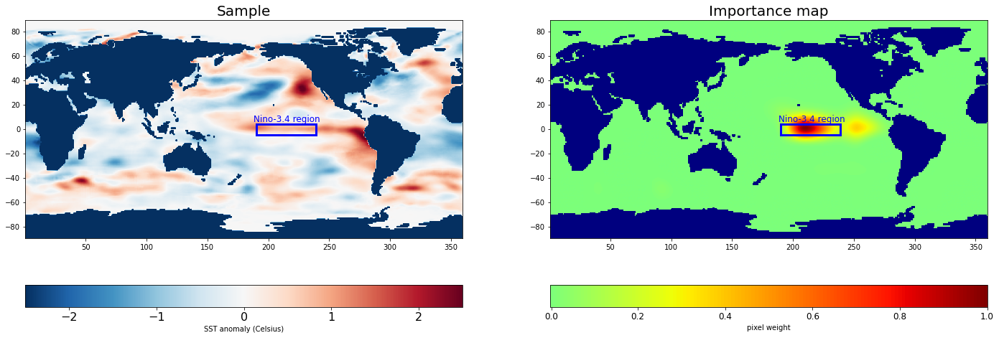

1


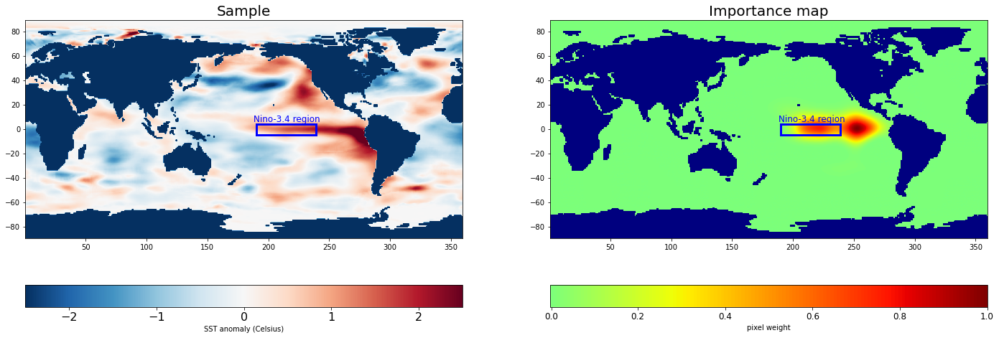

2


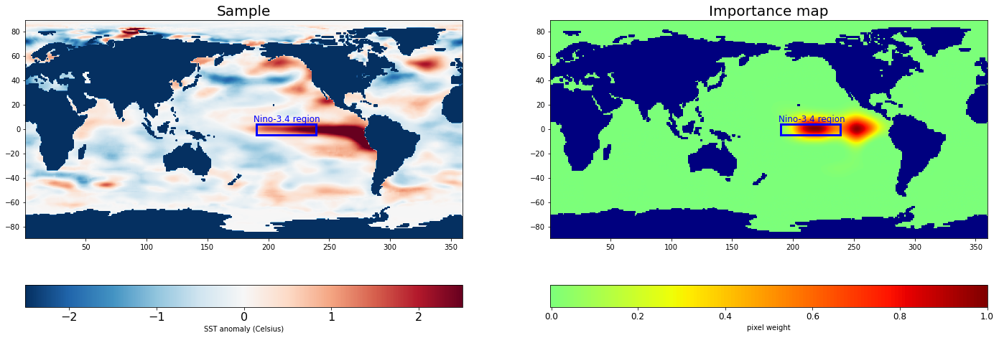

3


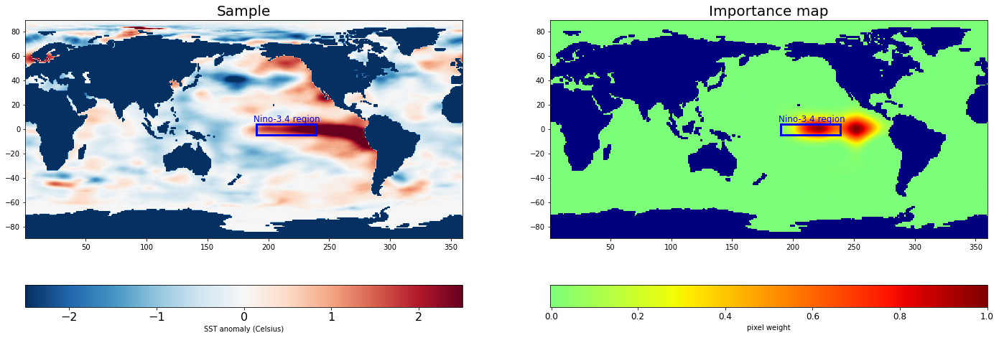

4


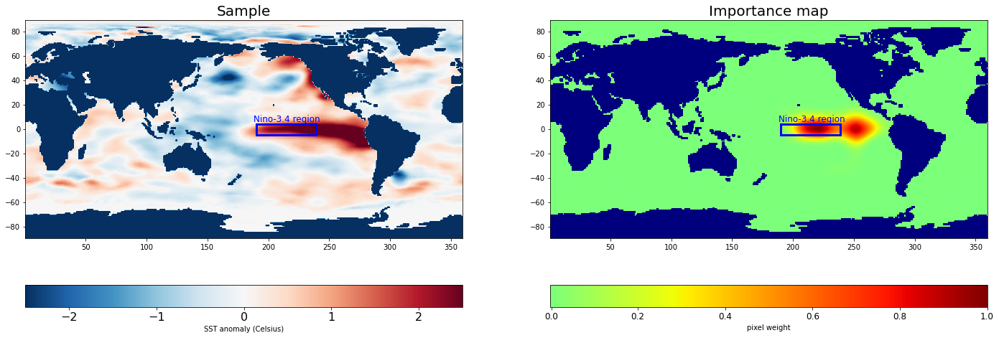

5


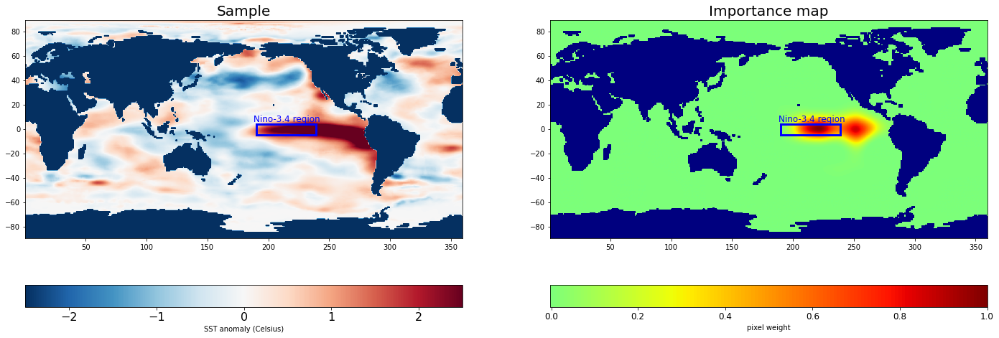

6


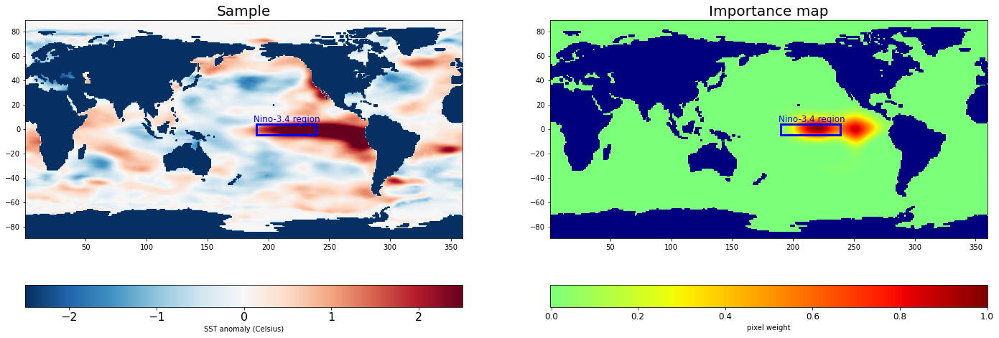

7


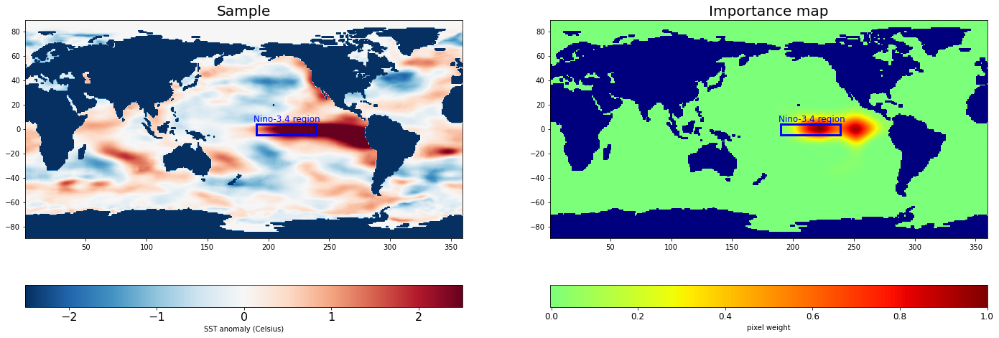

8


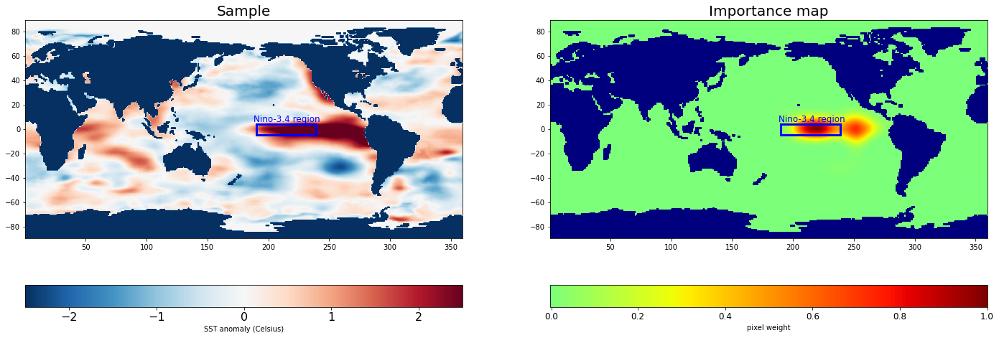

9


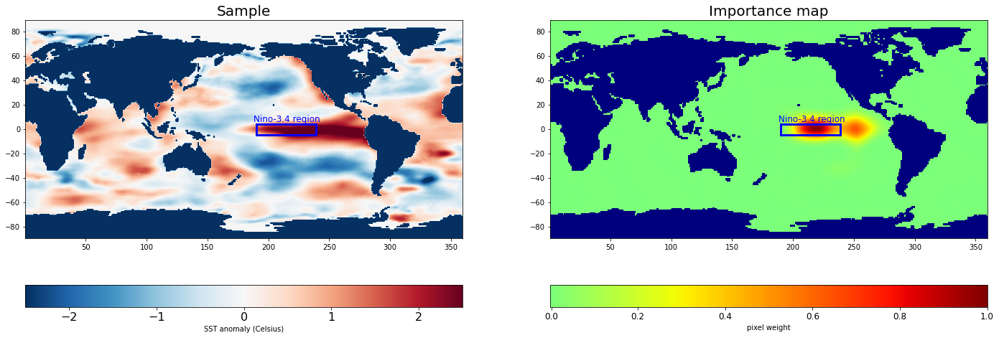

10


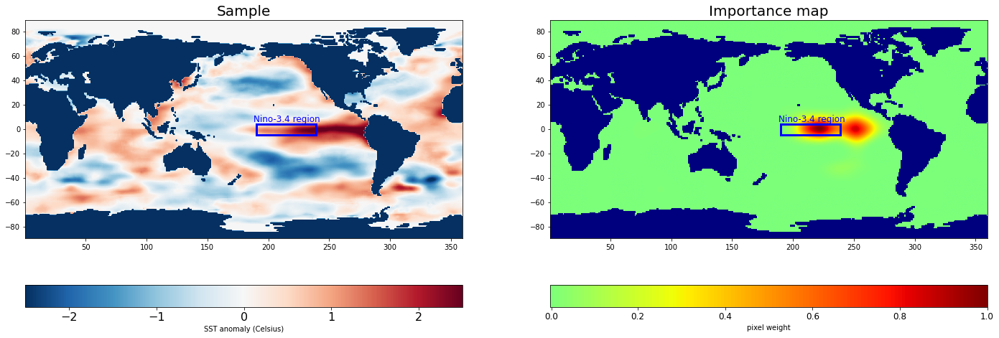

11


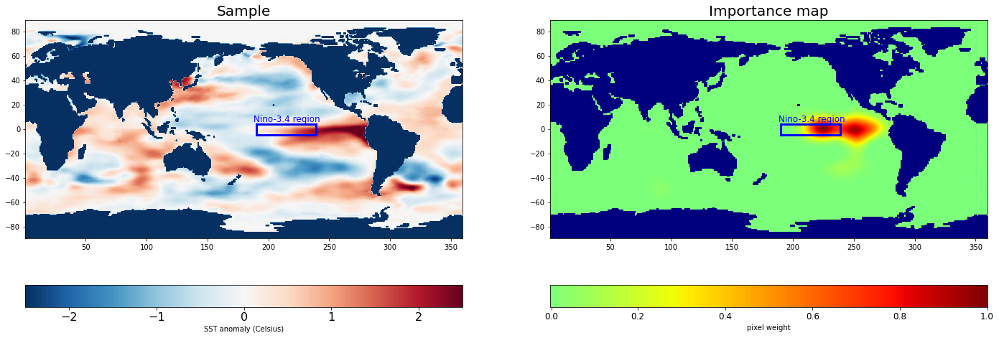

12


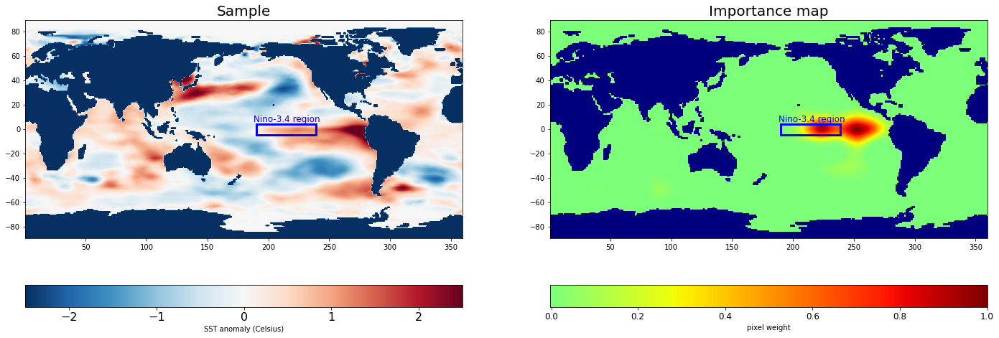

13


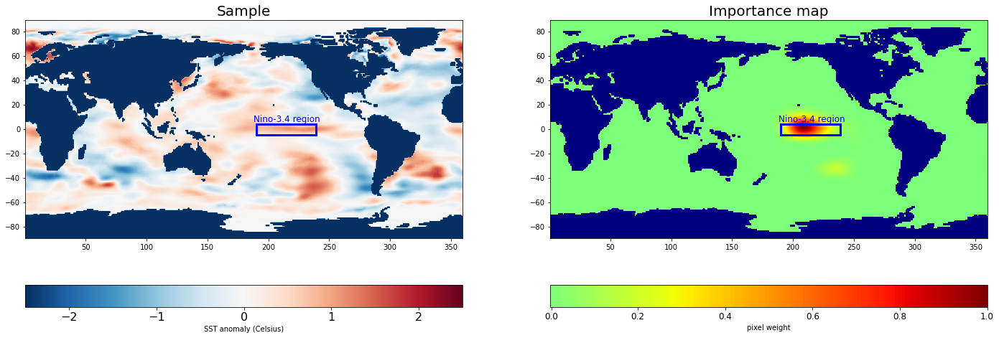

14


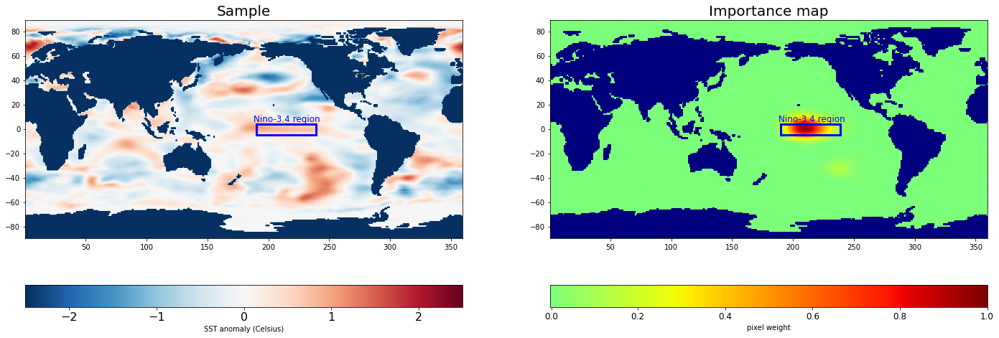

15


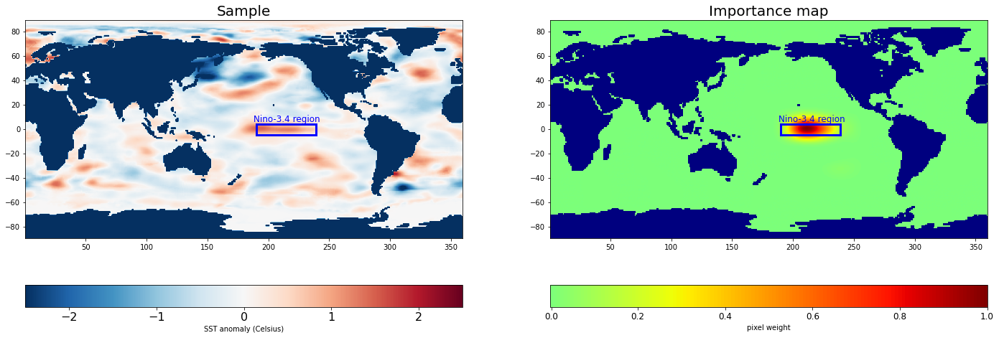

16


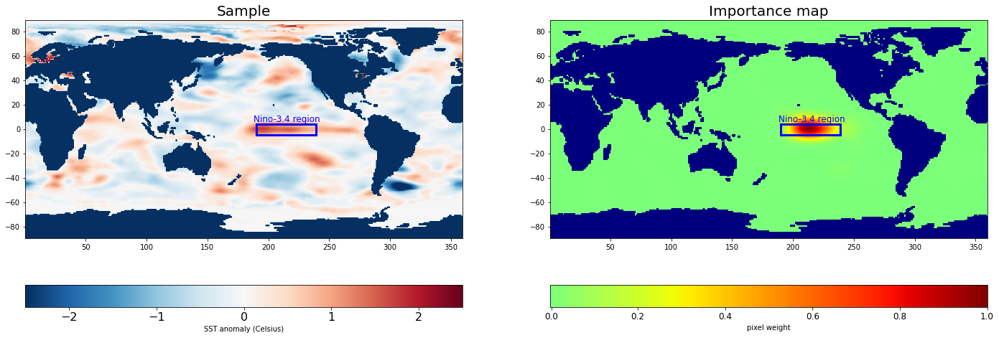

17


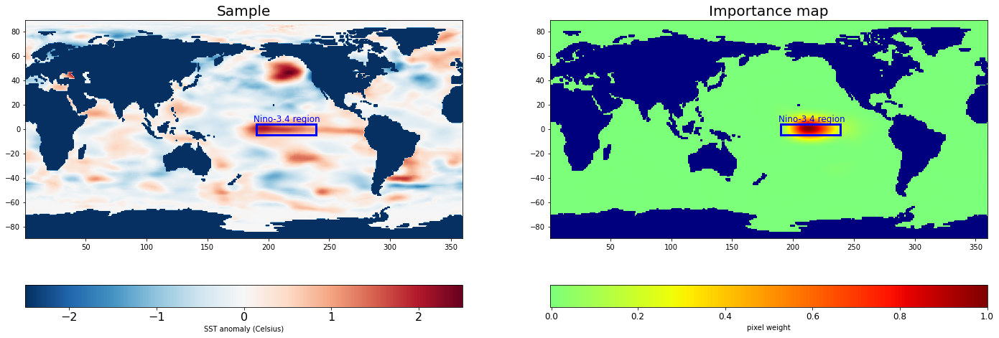

18


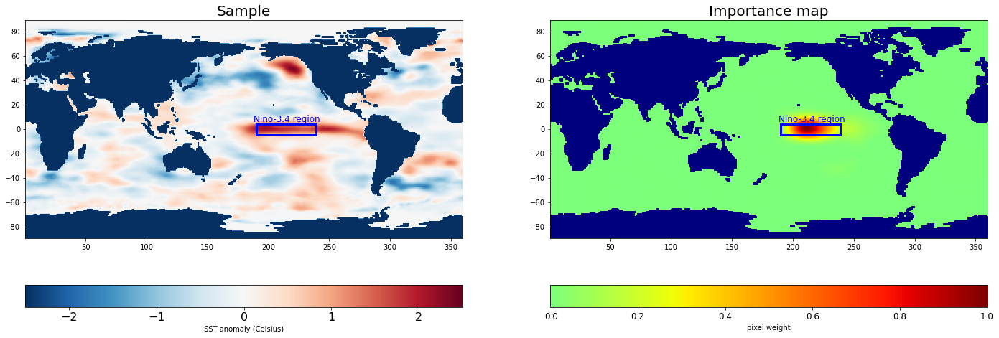

19


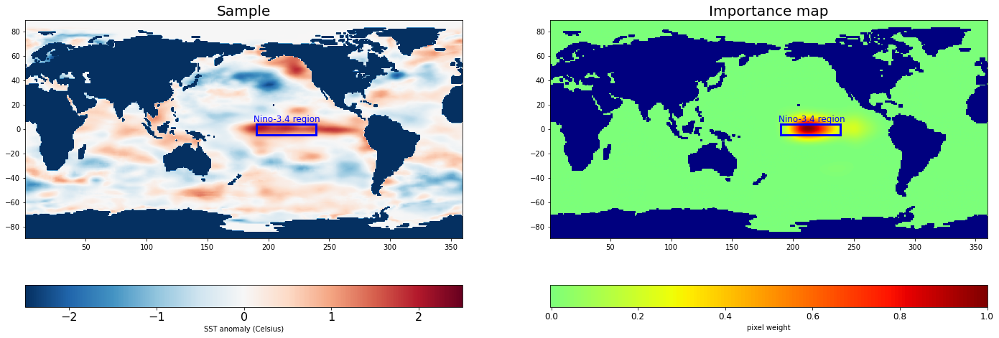

20


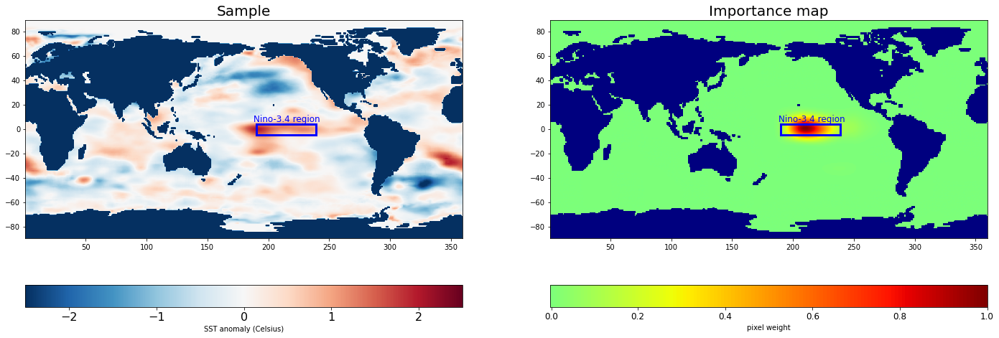

21


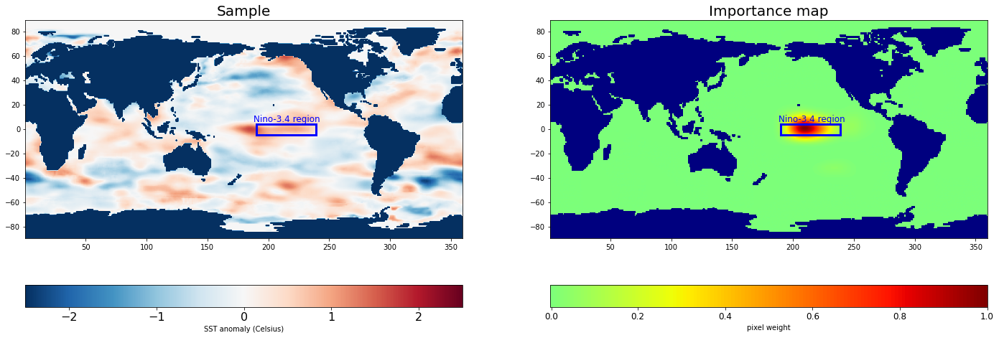

22


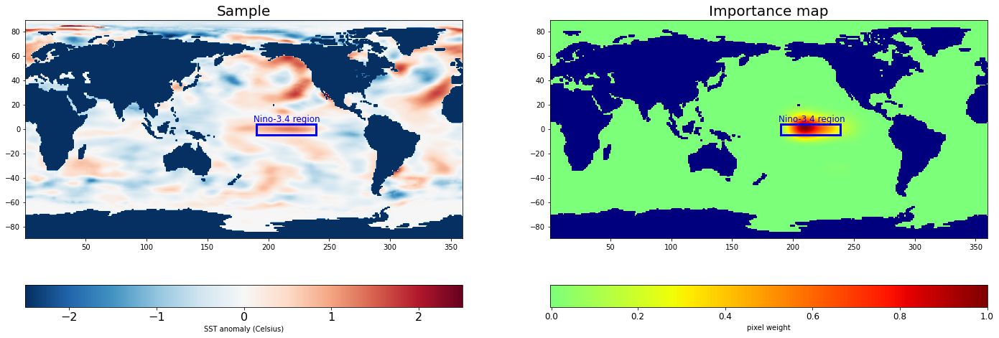

23


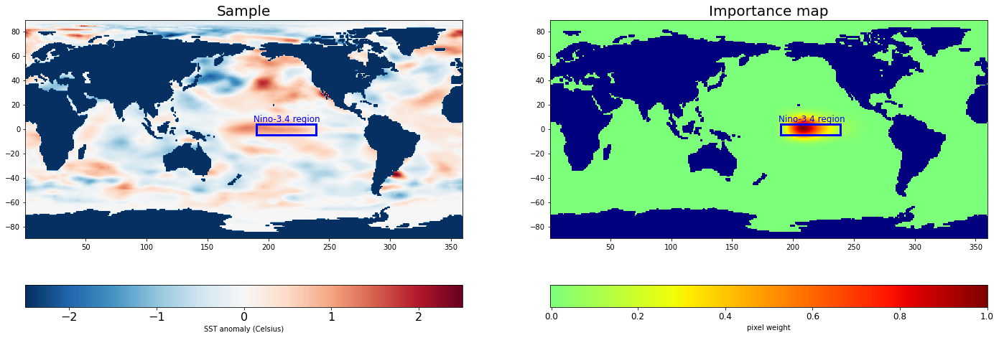

24


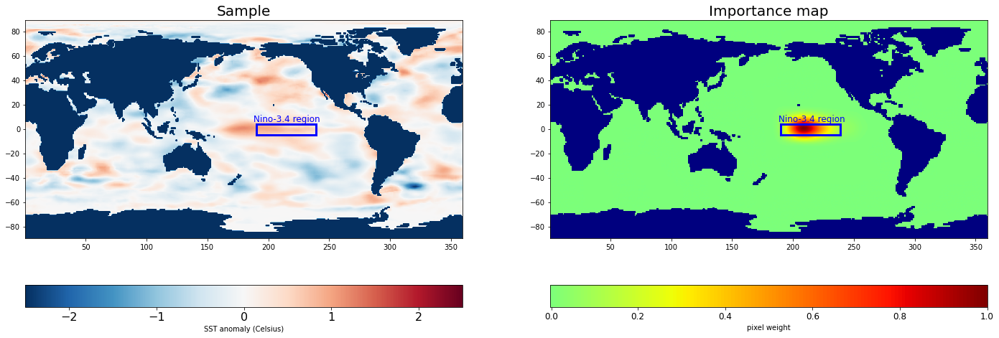

25


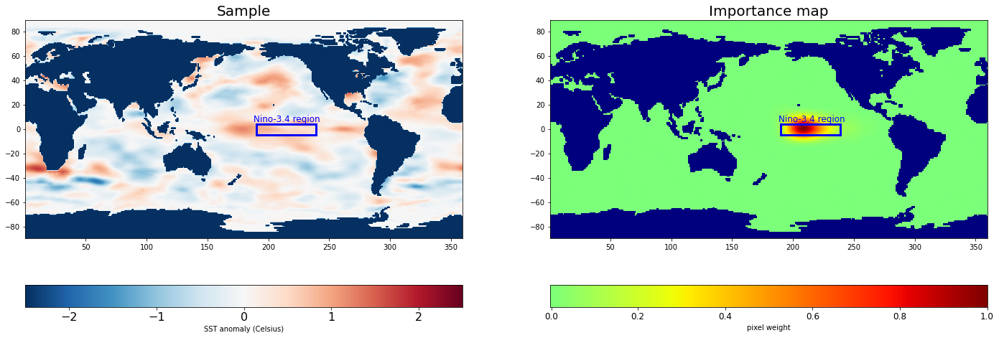

26


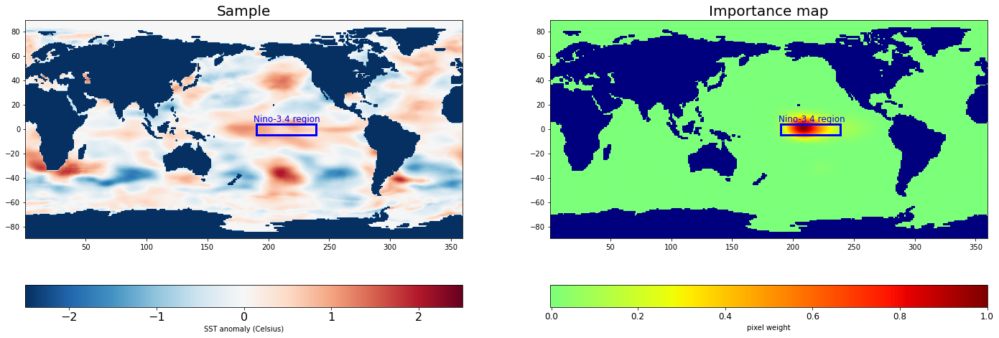

27


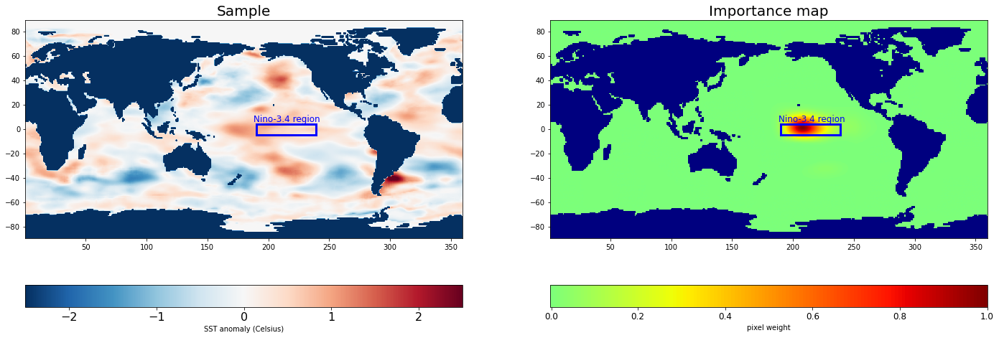

28


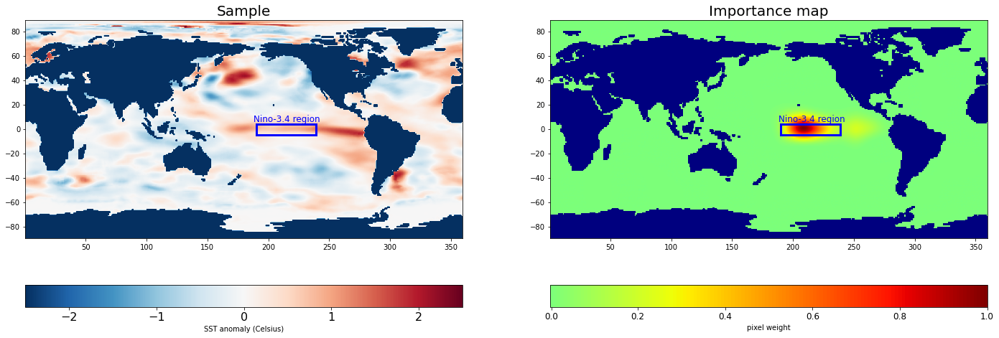

29


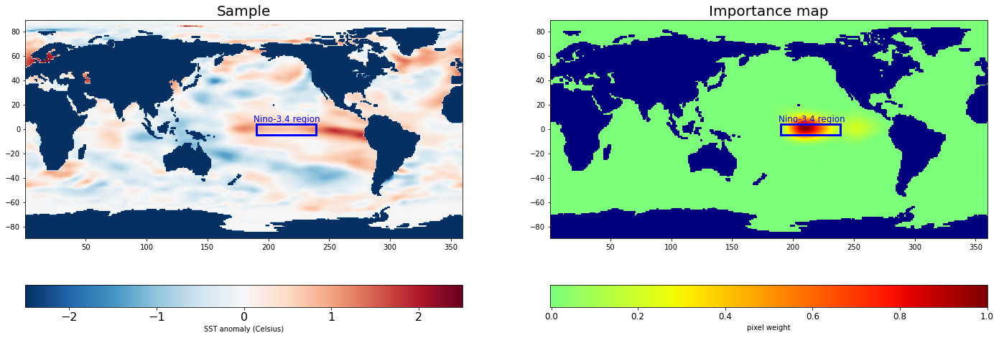

30


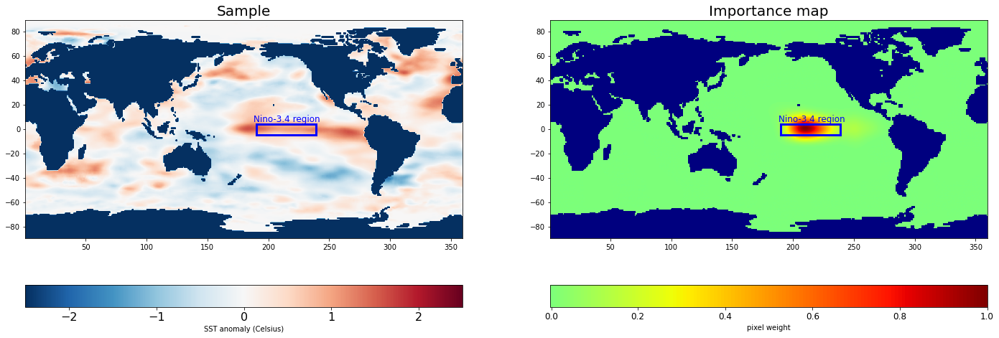

31


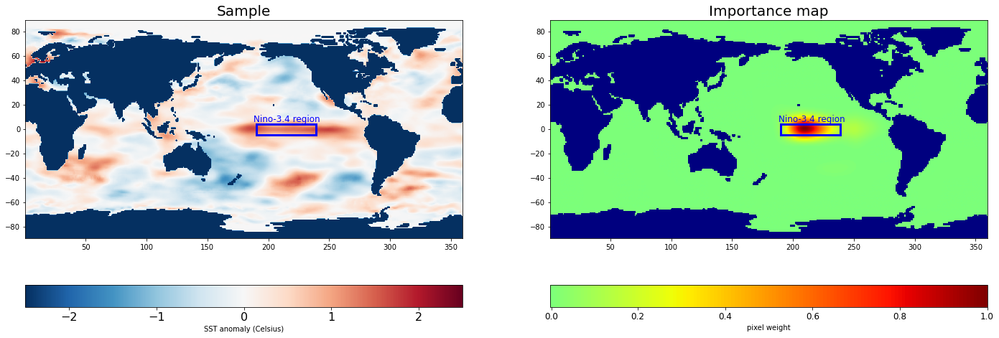

32


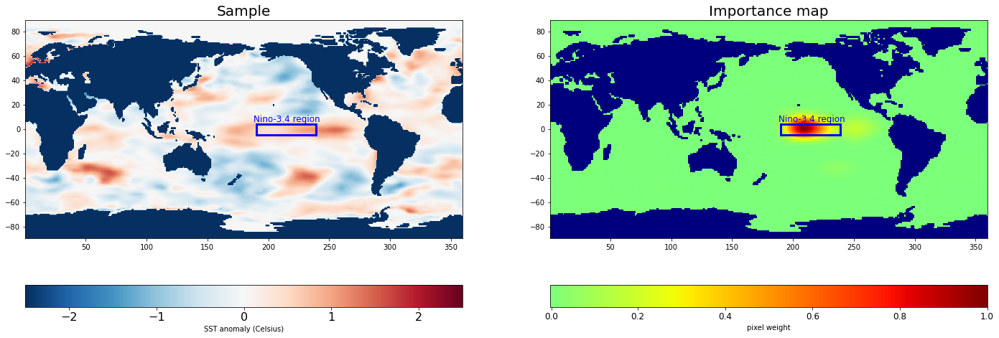

33


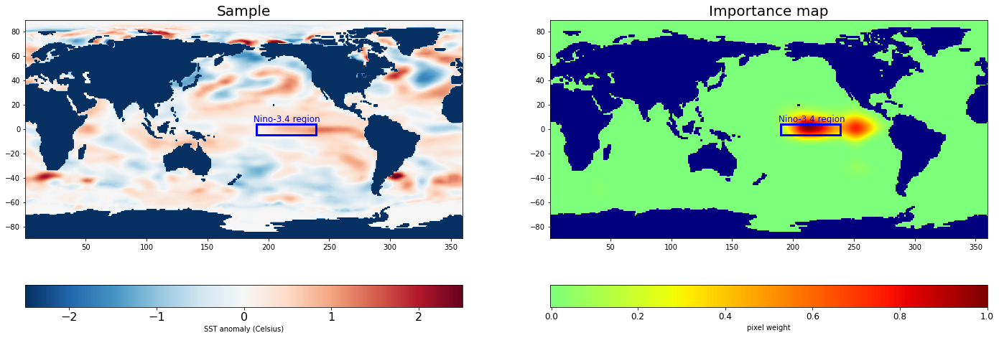

34


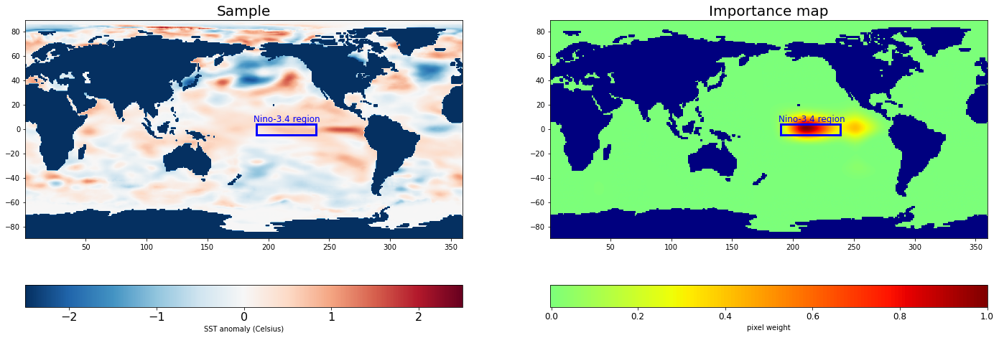

35


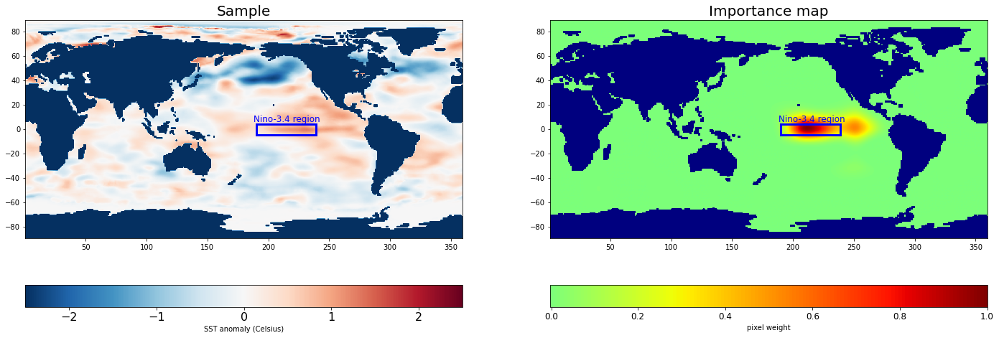

36


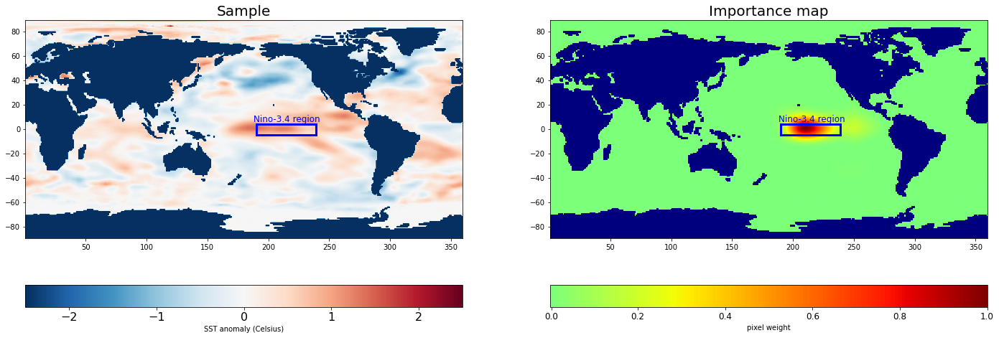

37


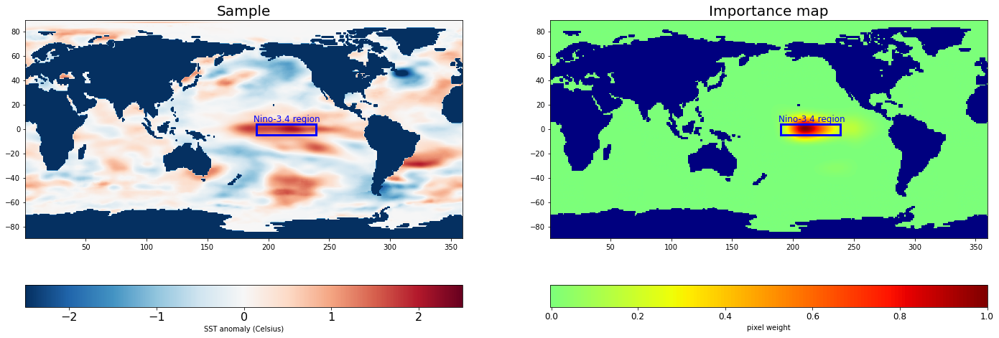

38


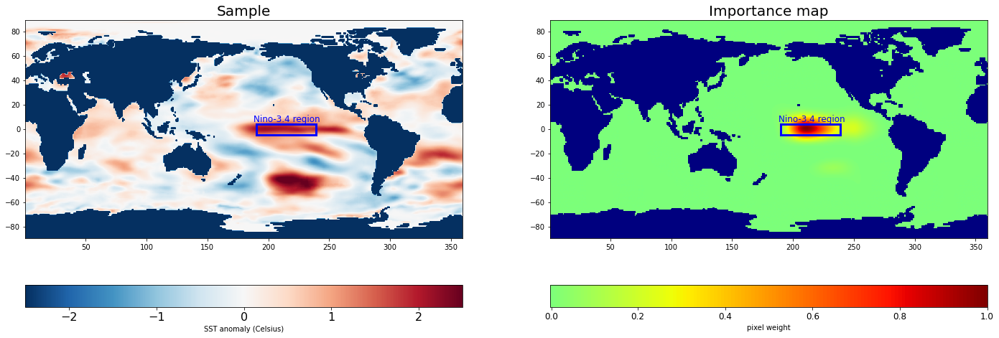

39


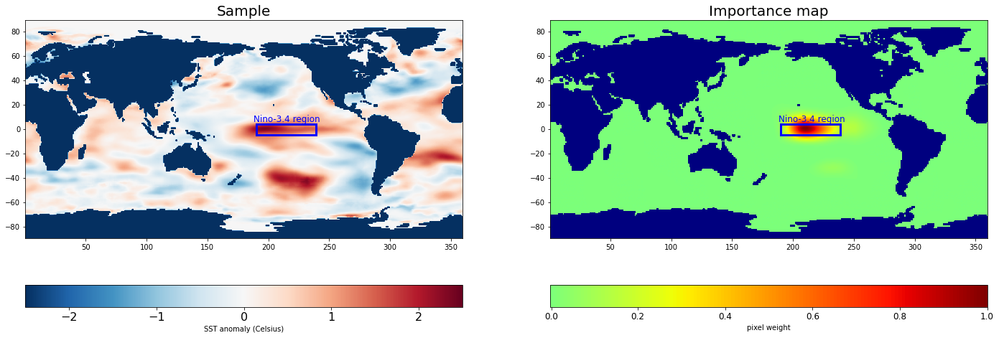

40


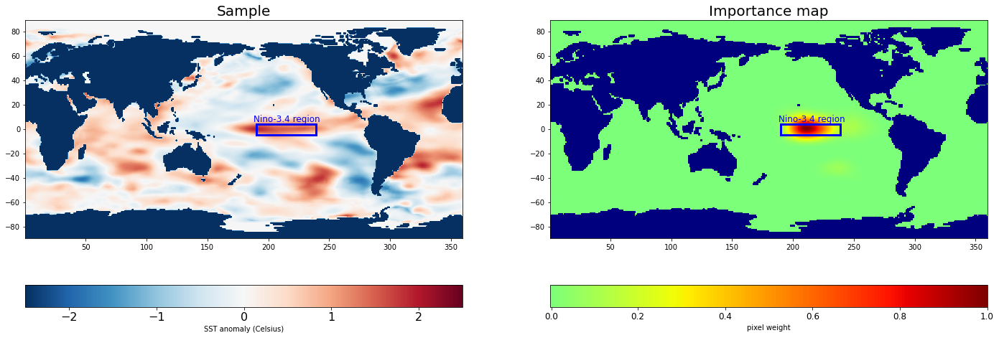

41


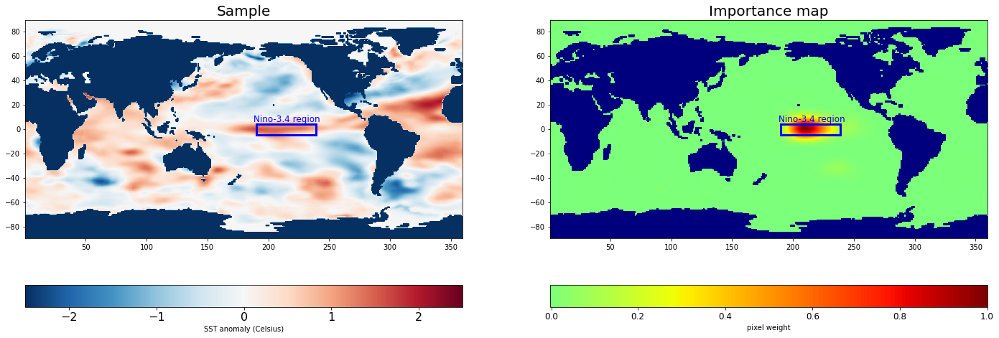

42


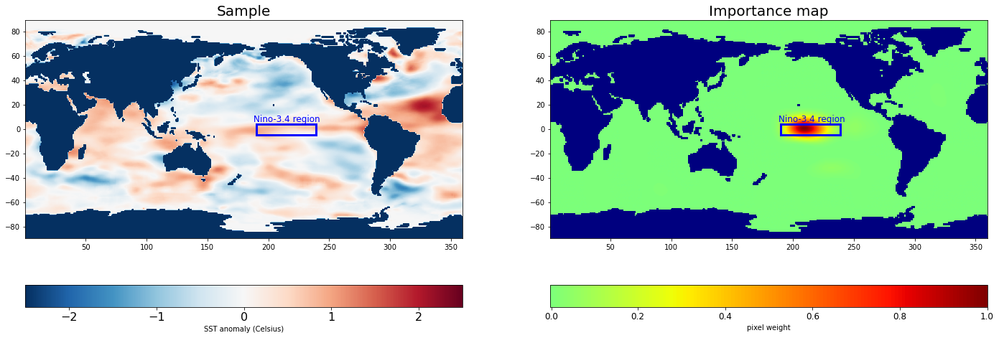

43


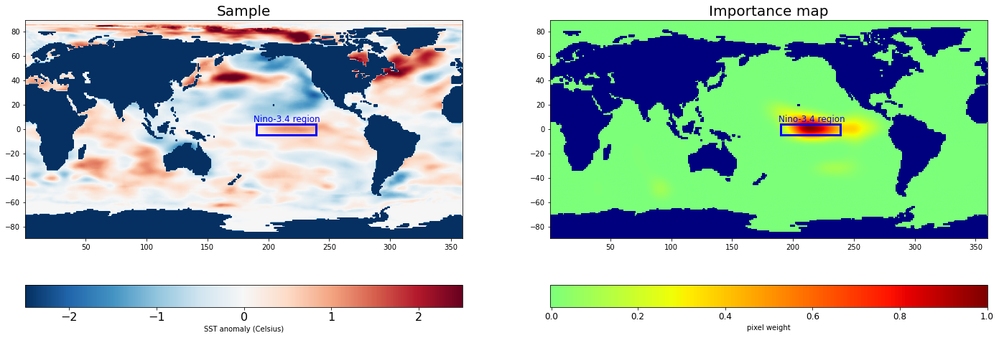

44


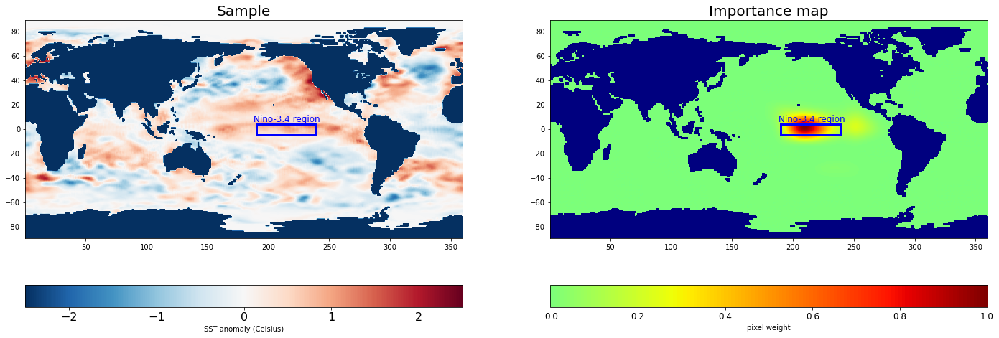

45


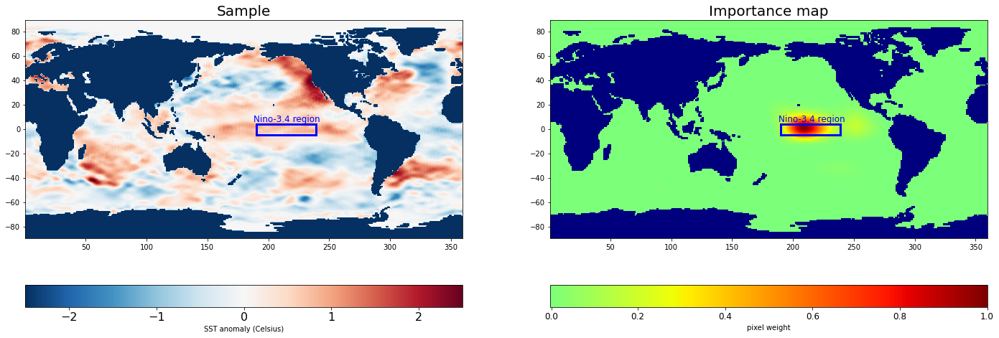

46


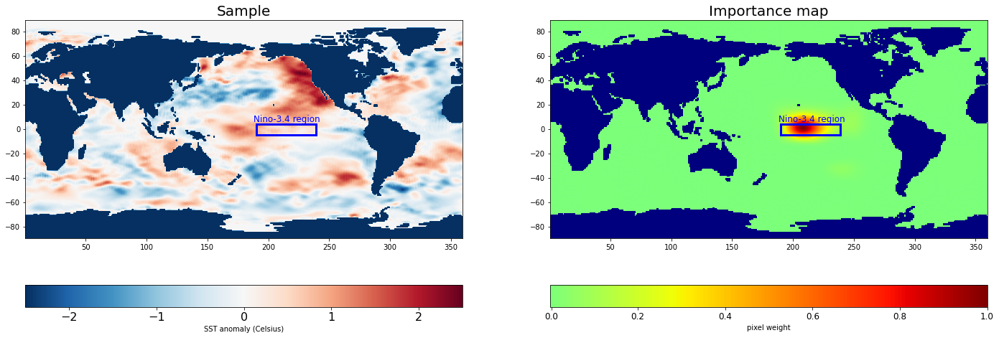

47


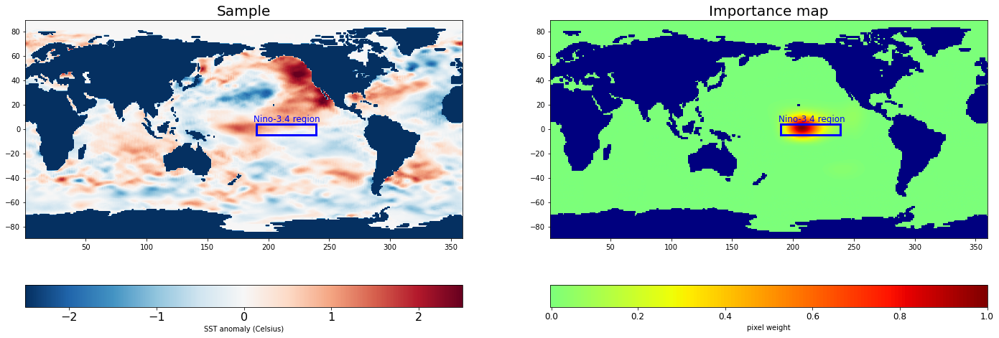

48


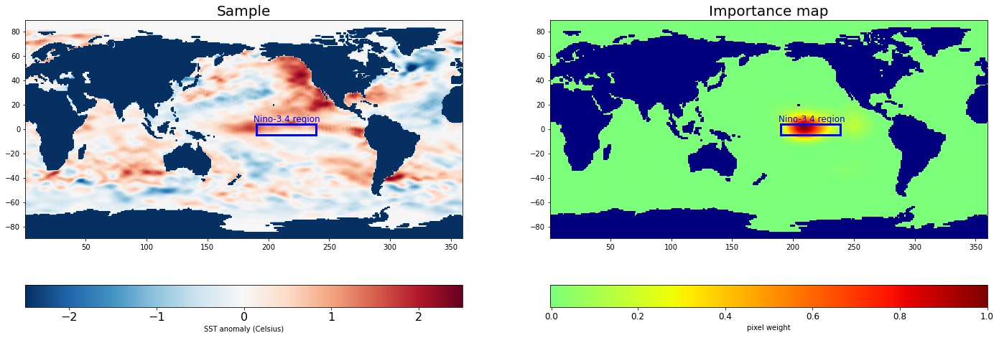

49


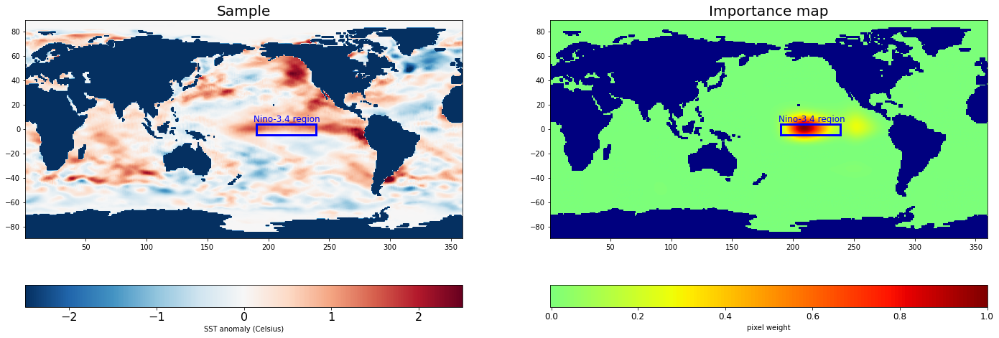

50


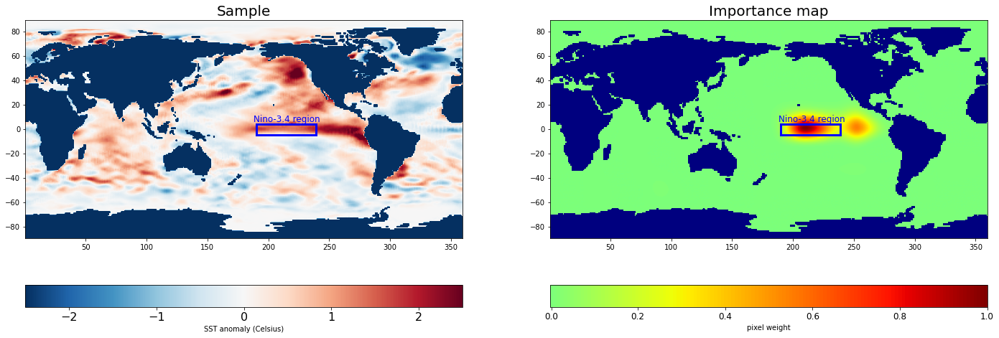

51


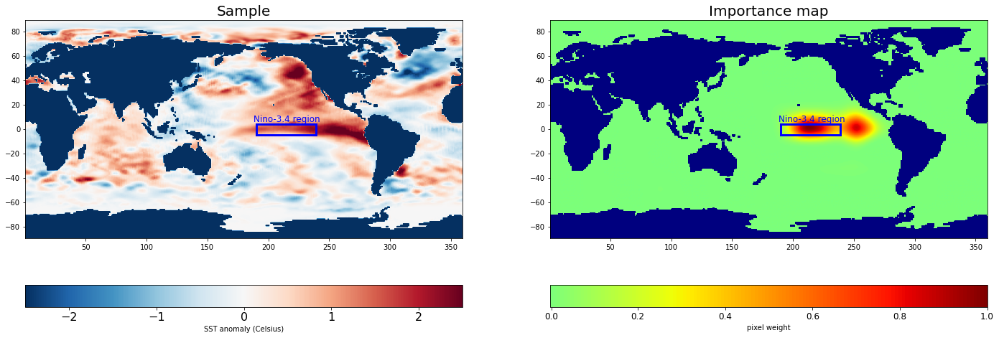

52


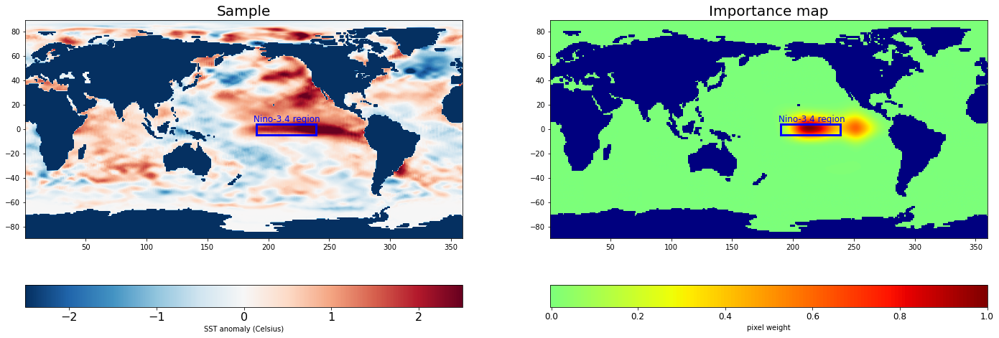

53


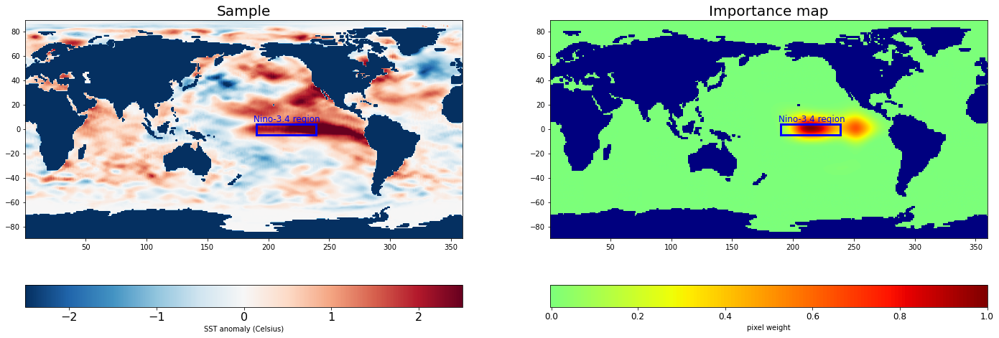

54


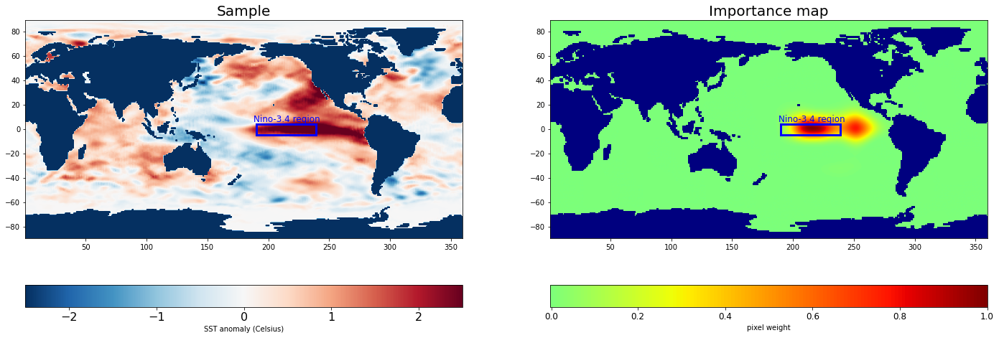

55


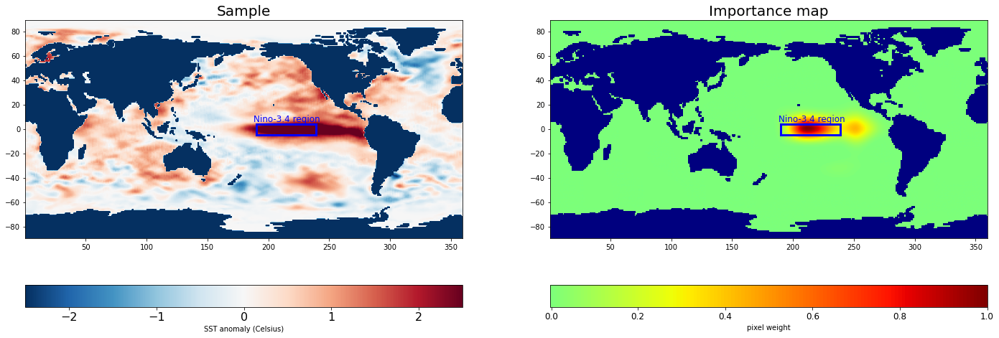

56


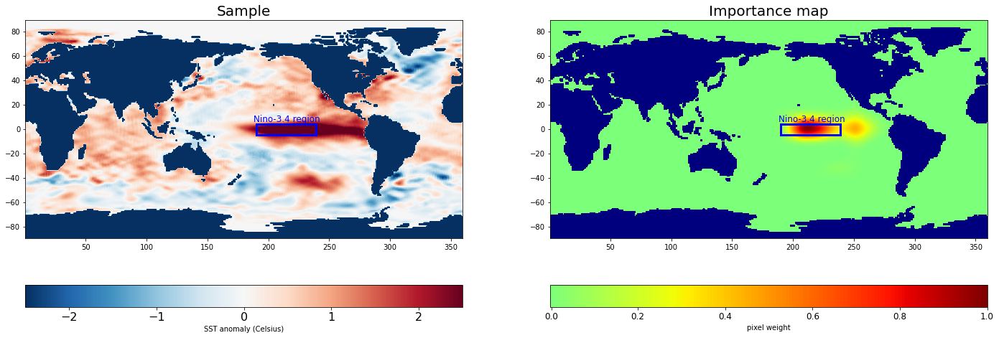

57


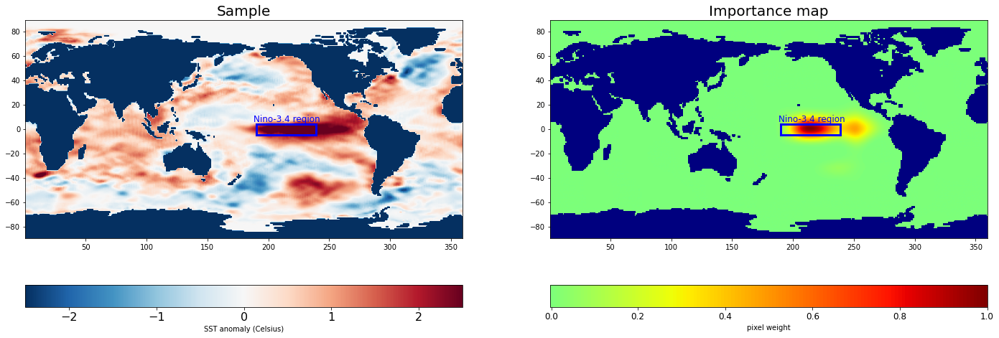

58


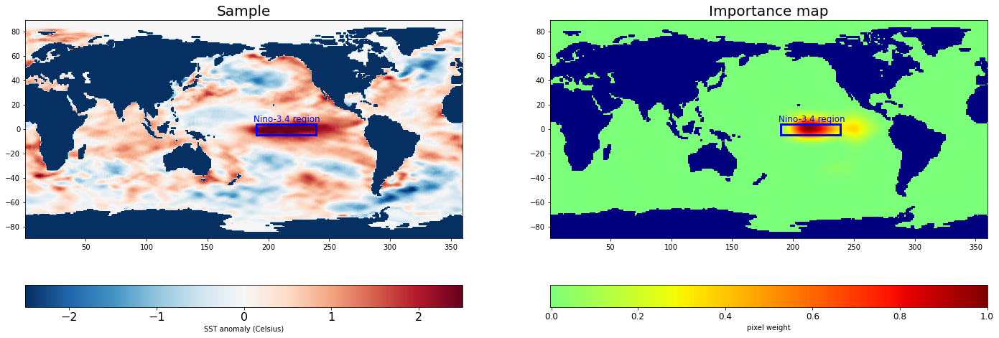

59


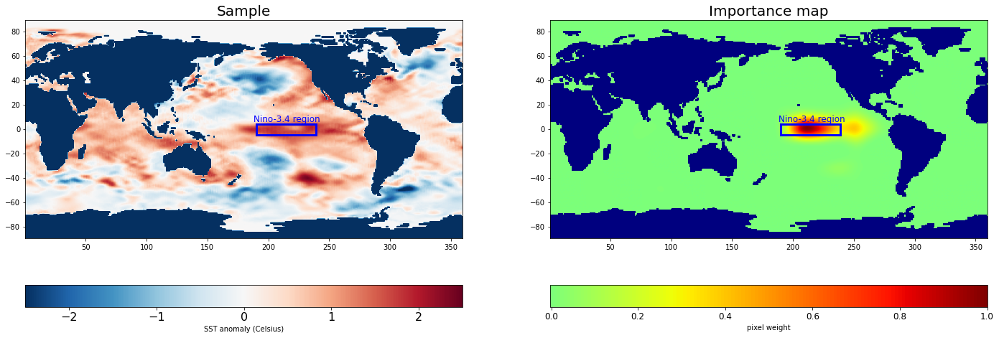

60


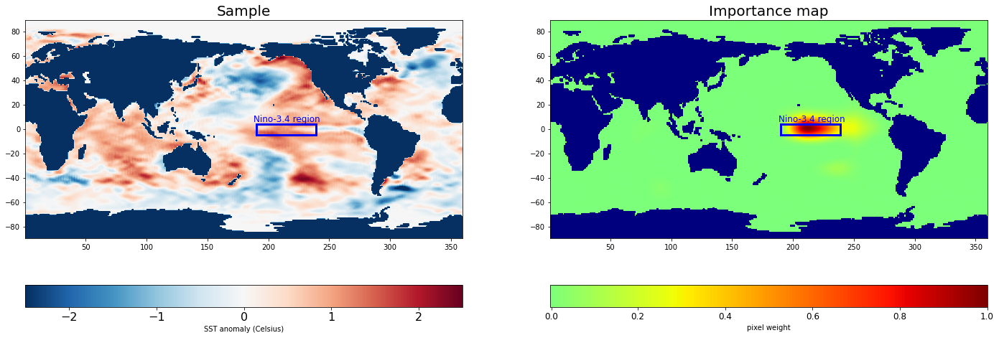

61


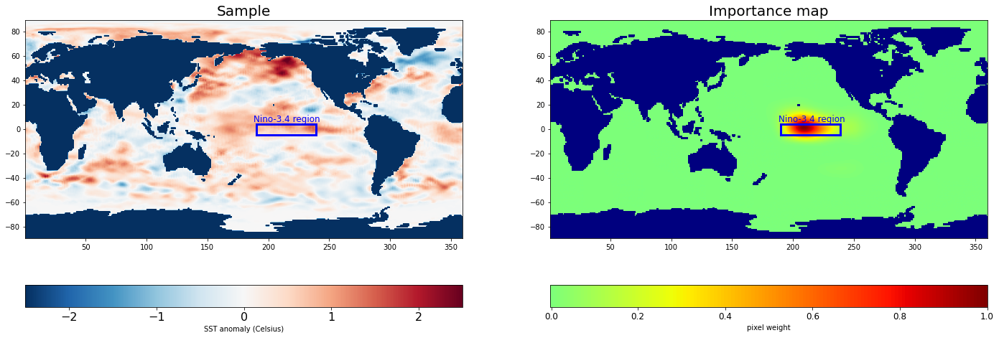

62


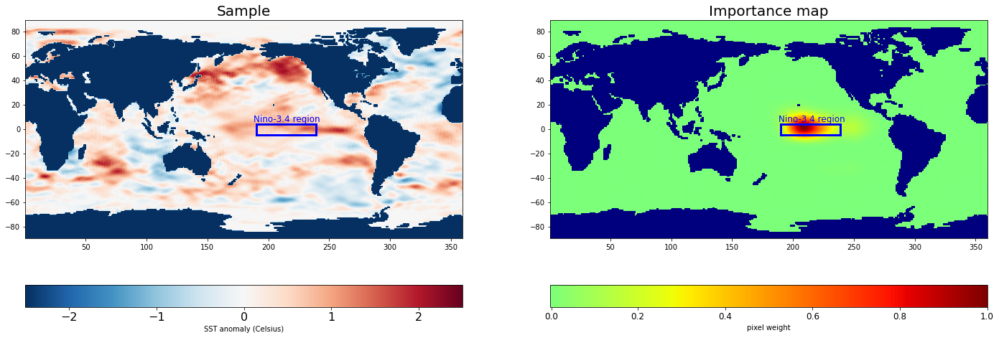

63


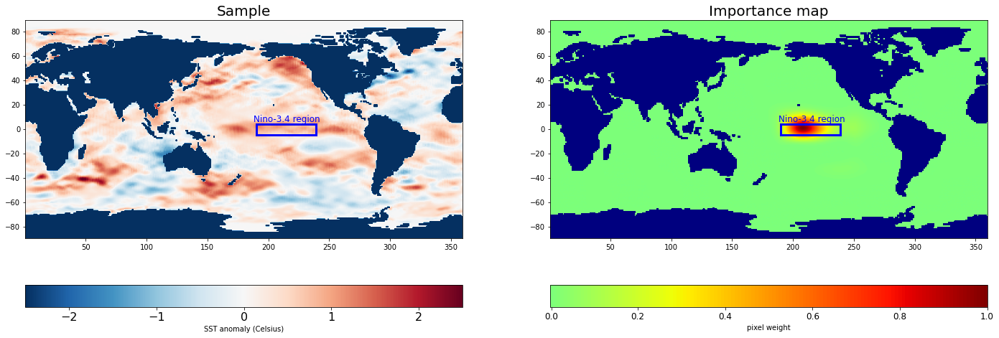

64


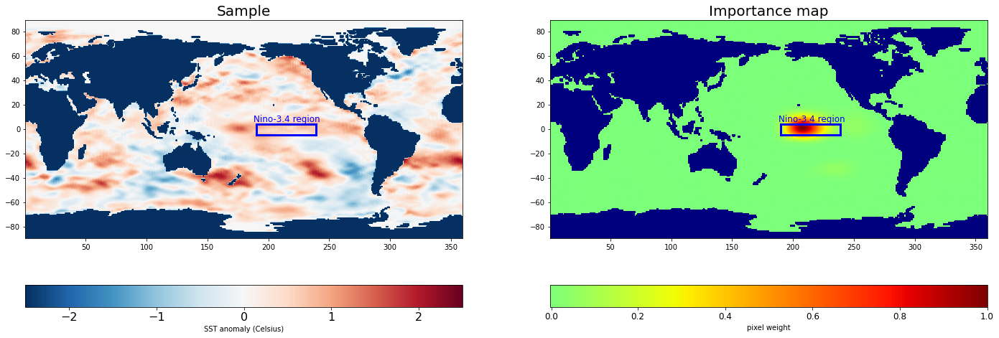

65


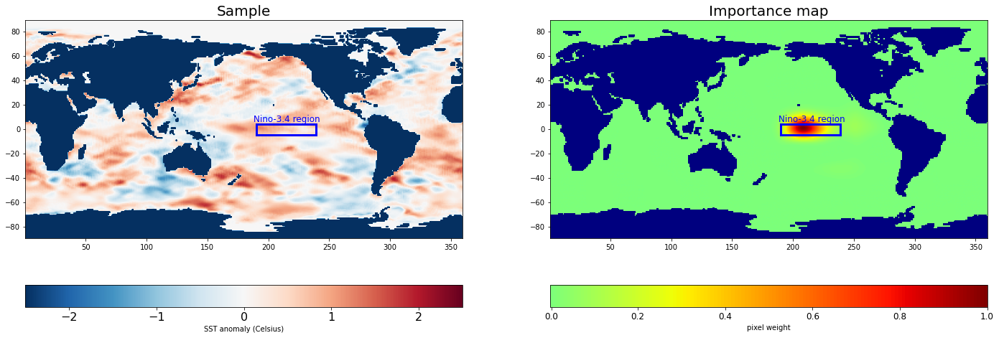

66


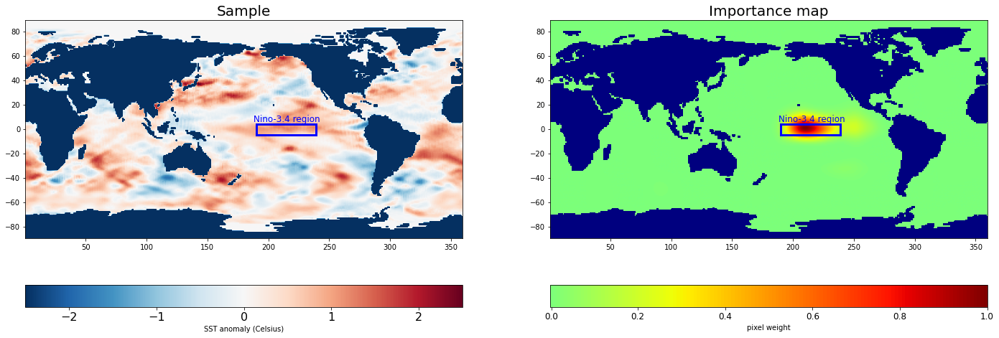

67


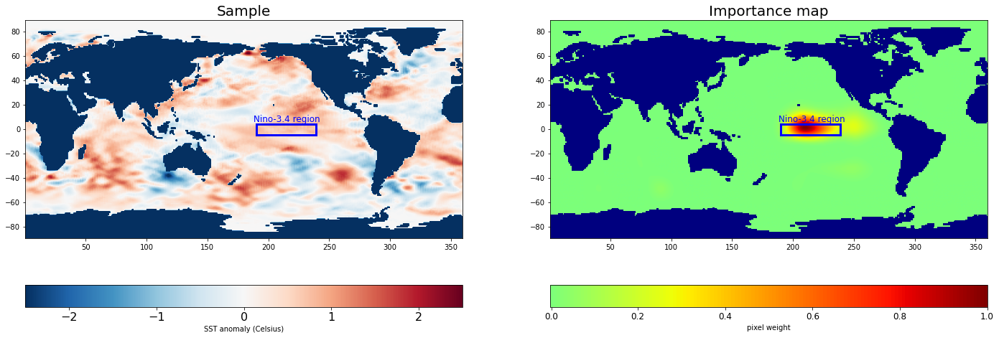

68


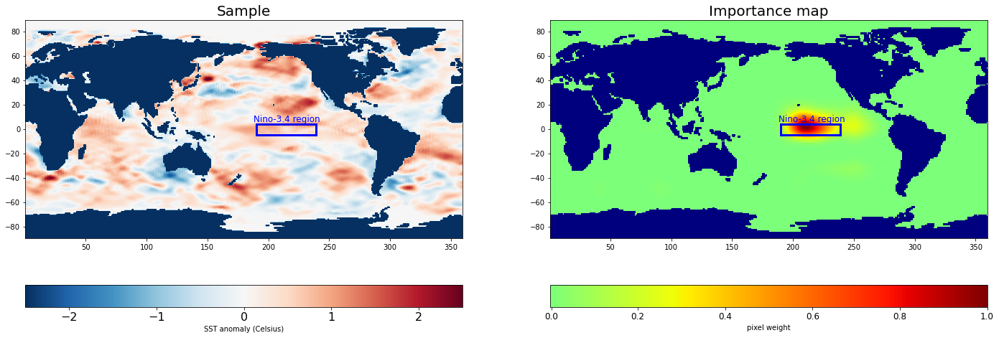

69


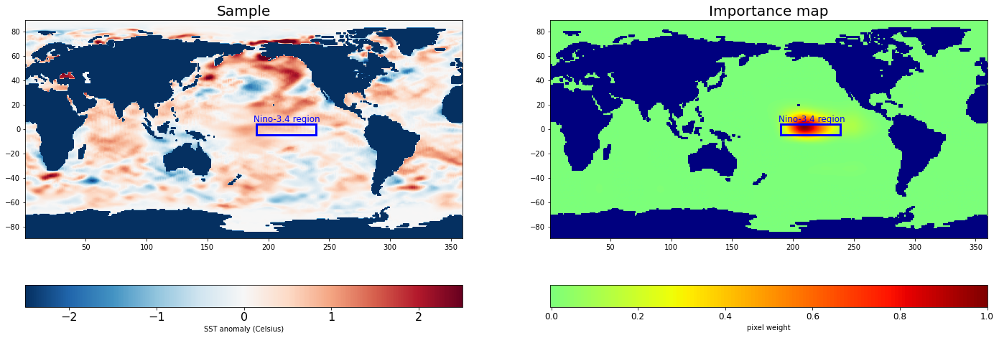

70


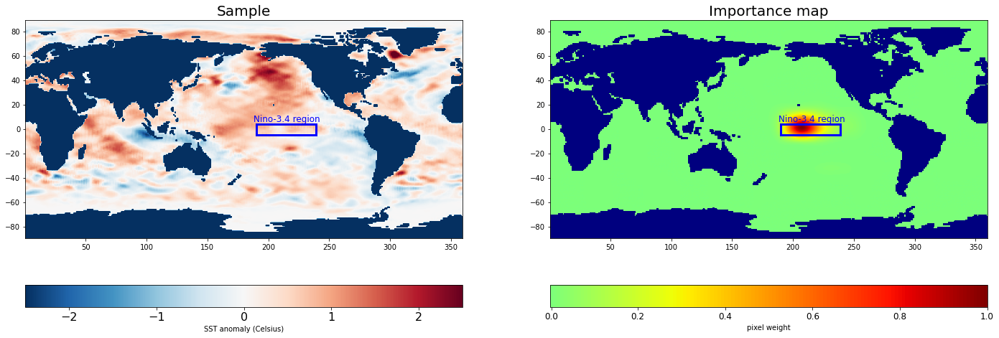

71


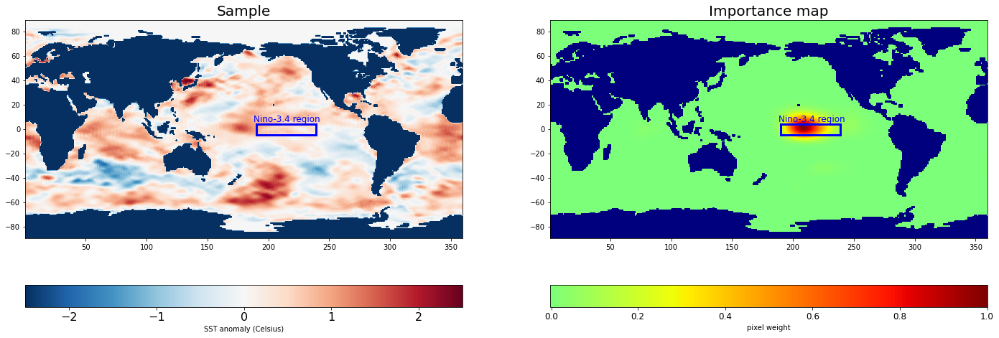

In [35]:
MODEL_TYPE = 'neural-additive-cnn'
# MODEL_TYPE = 'neural-additive-fcn'
# MODEL_TYPE = 'CNN4'
device = 'cpu'
ckpt_name = f'ENSO_{MODEL_TYPE}_v1.pt'
# ckpt_name = f'ENSO_{MODEL_TYPE}_v4.pt'
print(ckpt_name)
model = torch.load(f'checkpoints/{ckpt_name}')
model.eval()

""" Function to get importance heatmap from NACNN"""
def get_grid_weights(model, sst_map, device='cuda:0'):
    img = sst_map
    img = torch.Tensor(img)
    img = img[None, None, :, :].to(device)
    
    """ 1. Retrive grid (feature) importance from NAM's latent vector"""
    model.eval()
    grid_weights = model.latent_presigmoid(img)
    # grid_weights = torch.sigmoid(grid_weights)
    """ 2. Reconstruct latent vector to 2D and interpolate to original size"""
    grid_weights = grid_weights.view(1, 1, 180//16, 360//16)
    grid_weights = F.interpolate(grid_weights, size=(180,360), mode='bicubic')
    grid_weights = grid_weights[0,0,:,:]
    grid_weights = grid_weights.detach().cpu().numpy()
    grid_weights = grid_weights**2 * (grid_weights >= 0)
    grid_weights = grid_weights/grid_weights.max()
    # print(grid_weights.shape)
    
    return grid_weights

"""A. List to store importance maps in np.array based on TEST CASES"""
ElNino_importance = []

"""B. Traverse through all positive cases and generate importance maps"""
# batch_arr.shape
for idx, img in tqdm(enumerate(test_ElNino)):
    print(idx)
    fig, ax = plt.subplots(ncols=2, figsize=(24,8))
    """ 1. Raw pattern plot"""
    ax[0].set_title('Sample', fontsize=20)
    norm = colors.TwoSlopeNorm(vmin=-2.5, vcenter=0., vmax=2.5)
    sst = ax[0].imshow(img, cmap='RdBu_r', norm=norm, aspect='auto',
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    """ 1.1. Draw nino3.4 ROI -> where the model should look at"""
    h, w = (lats_nino34[-1]-lats_nino34[0]), (lons_nino34[-1]-lons_nino34[0])
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
    ax[0].add_patch(area_nino34)
    ax[0].text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12)
    # Setting for label size
    cbar0 = fig.colorbar(sst, ax=ax[0], orientation='horizontal', 
                         label='SST anomaly (Celsius)')
    cbar0.ax.tick_params(labelsize=16)
    
    # plt.figure(figsize=(10,5))
    """ 2. Contour pattern plot"""
    ax[1].set_title('Importance map', fontsize=20)
    """ Compute grid weights from interpretable Neural Additive model"""
    grid_weights = get_grid_weights(model, img, device)
    """ Filter out low-contribution grid"""
    # grid_weights = grid_weights * ((grid_weights < -1) | (grid_weights > 1))
    # plt.contour(lons, lats, grid_weights, cmap='viridis', alpha=0.5, 
    #             levels=np.linspace(-10, 10, 15), extend='both')
    norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
    grid_weights = grid_weights * land_mask + (-20)*(land_mask==0)
    hm = ax[1].imshow(grid_weights, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # Setting for label size
    cbar1 = fig.colorbar(hm, ax=ax[1], orientation='horizontal', 
                         label='pixel weight')
    cbar1.ax.tick_params(labelsize=12)
    
    """ 2.1. Draw nino3.4 ROI -> where the model should look at"""
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
    ax[1].add_patch(area_nino34)
    ax[1].text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12)
    
    # """ 3. Extracted Patterns plot"""
    # ax[2].set_title('Extracted Pattern', fontsize=20)
    # norm = colors.TwoSlopeNorm(vmin=-2.5, vcenter=0., vmax=2.5)
    # patterns = img*(grid_weights*(grid_weights>=0))
    # patterns = patterns*land_mask + (-20)*(land_mask==0)
    # ax[2].imshow(patterns, cmap='RdBu_r', norm=norm, aspect='auto',
    #            extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # cbar2 = fig.colorbar(sst, ax=ax[2], orientation='horizontal', 
    #                      label='SST anomaly (Celsius)')
    # cbar2.ax.tick_params(labelsize=16)
    
    ElNino_importance.append(grid_weights)
    plt.show()

  0%|          | 0/72 [00:00<?, ?it/s]

Text(188, 6, 'Nino-3.4 region')

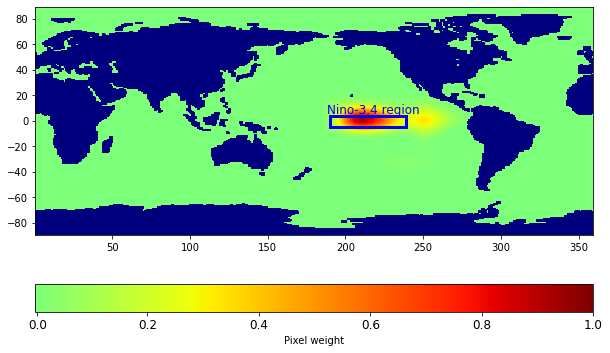

In [36]:
sst_importance = []

ElNino_all = test_ElNino
for idx in tqdm(range(len(ElNino_all))):
    # if test_labels[idx] == 1:
    img = ElNino_all[idx]
    grid_weights = get_grid_weights(model, img, device)
    sst_importance.append(grid_weights)

""" Compute Composite Importance Heatmap"""
sst_importance = np.array(sst_importance)
sst_importance = sst_importance.mean(axis=0)
sst_importance = sst_importance * land_mask + (-20)*(land_mask==0)

""" Visualization Composite Importance Heatmap"""
fig, ax = plt.subplots(figsize=(10,6))
norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
hm = ax.imshow(sst_importance, cmap='jet', norm=norm, aspect='auto',
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
cbar = fig.colorbar(hm, ax=ax, orientation='horizontal', 
                         label='Pixel weight')
cbar.ax.tick_params(labelsize=12)

h, w = (lats_nino34[-1]-lats_nino34[0]), (lons_nino34[-1]-lons_nino34[0])
area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
ax.add_patch(area_nino34)
ax.text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12)

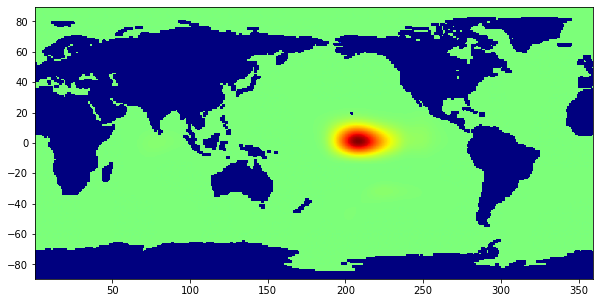

In [37]:
plt.figure(figsize=(10,5))
grid_weights = get_grid_weights(model, img, device)
grid_weights = grid_weights * land_mask + (-20)*(land_mask==0)
plt.imshow(grid_weights, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
           extent=[lons.min(), lons.max(), lats.min(), lats.max()])

## EVAL 2: TEST Inherent Interpretation: Spatial Attention

In [ ]:
MODEL_TYPE = 'attention-net'
device = 'cpu'
ckpt_name = f'checkpoints/ENSO_{MODEL_TYPE}.pt'
print(ckpt_name)

"""List to store Attention maps in np.array based on TEST CASES"""
ElNino_SAs = []

"""1. load model based on MODEL_TYPE, VERSION, and LEAD_DAYS""" 
model = torch.load(ckpt_name).to(device)
model.eval()

"""2. Traverse through all positive cases and generate Attention maps"""
for idx, img in tqdm(enumerate(test_ElNino), 'Explaining El Nino samples'):
    print(idx)
    orig_img = img
    img = copy.deepcopy(orig_img)
    """4b. Convert input snapshot to Tensor()"""
    img = np.expand_dims(img, axis=(0,1))
    img = torch.Tensor(img).to(device)
    img.requires_grad_(True)
    
    fig, ax = plt.subplots(ncols=2, figsize=(24,8))
    """ 1. Raw pattern plot"""
    ax[0].set_title('Sample', fontsize=20)
    norm = colors.TwoSlopeNorm(vmin=-2.5, vcenter=0., vmax=2.5)
    sst = ax[0].imshow(orig_img, cmap='RdBu_r', norm=norm, aspect='auto',
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    """ 1.1. Draw nino3.4 ROI -> where the model should look at"""
    h, w = (lats_nino34[-1]-lats_nino34[0]), (lons_nino34[-1]-lons_nino34[0])
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
    ax[0].add_patch(area_nino34)
    ax[0].text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12)
    # Setting for label size
    cbar0 = fig.colorbar(sst, ax=ax[0], orientation='horizontal', 
                         label='SST anomaly (Celsius)')
    cbar0.ax.tick_params(labelsize=16)

    """ 2. Contour pattern plot"""
    ax[1].set_title('Importance map', fontsize=20)
    attention = model.get_spatial_attn(img)
    attention = attention[:, None, :, :]
    attention = F.interpolate(attention, size=(180,360), mode='bicubic')
    saliency_map = attention.detach().cpu().numpy()
    saliency_map = saliency_map[0,0,:,:]
    # rescale in range [0,1]
    norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
    saliency_map = saliency_map * land_mask + (-20)*(land_mask==0)
    hm = ax[1].imshow(saliency_map, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # Setting for label size
    cbar1 = fig.colorbar(hm, ax=ax[1], orientation='horizontal', 
                         label='pixel weight')
    cbar1.ax.tick_params(labelsize=12)

    """ 2.1. Draw nino3.4 ROI -> where the model should look at"""
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
    ax[1].add_patch(area_nino34)
    ax[1].text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12, alpha=0.7)
    plt.show()
    
    # """Record the LRP map for current Positive Case"""
    ElNino_SAs.append(saliency_map)

## EVAL 3: TEST Posthoc Explanation 1: LRP

In [25]:
# if(not os.path.exists('zennit')):
#     !git clone https://github.com/chr5tphr/zennit.git
#     !pip install zennit
    
from zennit.composites import EpsilonPlus, EpsilonPlusFlat, EpsilonAlpha2Beta1, EpsilonAlpha2Beta1Flat
from zennit.composites import EpsilonGammaBox, ZBox
from zennit.rules import ZPlus
from zennit.canonizers import Canonizer, AttributeCanonizer, SequentialMergeBatchNorm, CompositeCanonizer
from zennit.attribution import Gradient, IntegratedGradients
import copy

In [ ]:
MODEL_TYPE = 'lenet5'
device = 'cpu'
ckpt_name = f'checkpoints/ENSO_{MODEL_TYPE}.pt'
print(ckpt_name)

"""List to store LRP maps in np.array based on TEST CASES"""
ElNino_LRPs = []

"""1. load model based on MODEL_TYPE, VERSION, and LEAD_DAYS""" 
model = torch.load(ckpt_name).to(device)
model.eval()

"""2. specify LRP rules""" 
canonizers = [Canonizer]
# composite = EpsilonPlusFlat()
composite = EpsilonAlpha2Beta1Flat()
# composite = EpsilonPlus()
# composite = EpsilonGammaBox(low=-1, high=1, canonizers=canonizers)

"""3. Traverse through all positive cases and generate LRP maps"""
for idx, img in tqdm(enumerate(test_ElNino), 'Explaining El Nino samples'):
    print(idx)
    orig_img = img
    img = copy.deepcopy(orig_img)
    """4b. Convert input snapshot to Tensor()"""
    img = np.expand_dims(img, axis=(0,1))
    img = torch.Tensor(img).to(device)
    img.requires_grad_(True)
    
    fig, ax = plt.subplots(ncols=2, figsize=(24,8))
    """ 1. Raw pattern plot"""
    ax[0].set_title('Sample', fontsize=20)
    norm = colors.TwoSlopeNorm(vmin=-2.5, vcenter=0., vmax=2.5)
    sst = ax[0].imshow(orig_img, cmap='RdBu_r', norm=norm, aspect='auto',
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    """ 1.1. Draw nino3.4 ROI -> where the model should look at"""
    h, w = (lats_nino34[-1]-lats_nino34[0]), (lons_nino34[-1]-lons_nino34[0])
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
    ax[0].add_patch(area_nino34)
    ax[0].text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12)
    # Setting for label size
    cbar0 = fig.colorbar(sst, ax=ax[0], orientation='horizontal', 
                         label='SST anomaly (Celsius)')
    cbar0.ax.tick_params(labelsize=16)

    """ 2. Contour pattern plot"""
    ax[1].set_title('Importance map', fontsize=20)
    with Gradient(model=model, composite=composite) as attributor:
        out, saliency_map = attributor(img, torch.Tensor([[1.]]))
    saliency_map = np.array(saliency_map)[0,0,:,:]
    saliency_map = saliency_map*(saliency_map>=0)
    # rescale in range [0,1]
    saliency_map = saliency_map / max(saliency_map.max(), 1e-6)
    norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
    saliency_map = saliency_map * land_mask + (-20)*(land_mask==0)
    hm = ax[1].imshow(saliency_map, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # Setting for label size
    cbar1 = fig.colorbar(hm, ax=ax[1], orientation='horizontal', 
                         label='pixel weight')
    cbar1.ax.tick_params(labelsize=12)

    """ 2.1. Draw nino3.4 ROI -> where the model should look at"""
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
    ax[1].add_patch(area_nino34)
    ax[1].text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12, alpha=0.7)
    plt.show()
    # """Record the LRP map for current Positive Case"""
    ElNino_LRPs.append(saliency_map)

Text(0.5, 0, 'Longitude')

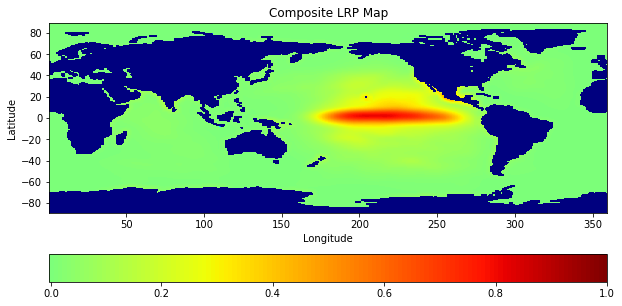

In [38]:
"""Retrieve LRP composite for True Positive cases"""
LRP_composite = np.array(ElNino_LRPs).mean(axis=0)
# LRP_composite = LRP_composite / LRP_composite.max()

"""Plot Composite LRP map from list of case LRP maps"""
plt.figure(figsize=(10,5))
"""Correspondind x/y ticks for the LRP map"""
xmax, ymax = LRP_composite.shape[1], LRP_composite.shape[0]
plt.title(f'Composite LRP Map')
plt.imshow(LRP_composite, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
           extent=[lons.min(), lons.max(), lats.min(), lats.max()])
plt.colorbar(orientation='horizontal')
plt.ylabel('Latitude')
plt.xlabel('Longitude')

# """
#     Composite Contour LRP patterns
# """
# plt.subplot(1,2,2)
# plt.title(f'Composite LRP Pattern')
# plt.contour(lons, lats, np.flip(np.fliplr(LRP_composite)), levels=np.linspace(0.7, 1, 3), 
#             cmap='viridis', vmin=0.7, vmax=1, extend='both')
# plt.ylabel('Latitude')
# plt.xlabel('Longitude')
# # plt.colorbar()

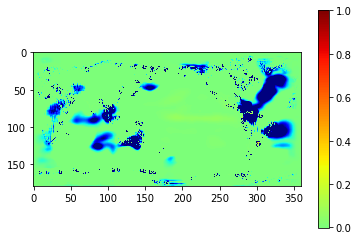

In [56]:
canonizers = [SequentialMergeBatchNorm()]
composite = EpsilonGammaBox(low=-3., high=3., canonizers=canonizers)

img = test_ElNino[0]
img = np.expand_dims(img, axis=(0,1))
img = torch.Tensor(img).to(device)
img.requires_grad_(True)
data = img

with Gradient(model=model, composite=composite) as attributor:
    out, relevance = attributor(data, torch.Tensor([[1.]]))
    
relevance = relevance/relevance.max()
plt.imshow(relevance[0,0], norm=norm, cmap='jet')
plt.colorbar()
plt.show()

## EVAL 4: TEST Integrated Gradient (IG) Explanations

In [ ]:
MODEL_TYPE = 'lenet5'
device = 'cpu'
ckpt_name = f'checkpoints/ENSO_{MODEL_TYPE}.pt'
print(ckpt_name)

"""List to store Integrated Gradients (IGs) maps in np.array based on TEST CASES"""
ElNino_IGs = []

"""1. load model based on MODEL_TYPE, VERSION, and LEAD_DAYS""" 
model = torch.load(ckpt_name).to(device)
model.eval()

"""2. Traverse through all positive cases and generate IGs maps"""
for idx, img in tqdm(enumerate(test_ElNino), 'Explaining El Nino samples'):
    print(idx)
    orig_img = img
    img = copy.deepcopy(orig_img)
    """4b. Convert input snapshot to Tensor()"""
    img = np.expand_dims(img, axis=(0,1))
    img = torch.Tensor(img).to(device)
    img.requires_grad_(True)
    
    fig, ax = plt.subplots(ncols=2, figsize=(24,8))
    """ 1. Raw pattern plot"""
    ax[0].set_title('Sample', fontsize=20)
    norm = colors.TwoSlopeNorm(vmin=-2.5, vcenter=0., vmax=2.5)
    sst = ax[0].imshow(orig_img, cmap='RdBu_r', norm=norm, aspect='auto',
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    """ 1.1. Draw nino3.4 ROI -> where the model should look at"""
    h, w = (lats_nino34[-1]-lats_nino34[0]), (lons_nino34[-1]-lons_nino34[0])
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
    ax[0].add_patch(area_nino34)
    ax[0].text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12)
    # Setting for label size
    cbar0 = fig.colorbar(sst, ax=ax[0], orientation='horizontal', 
                         label='SST anomaly (Celsius)')
    cbar0.ax.tick_params(labelsize=16)

    """ 2. Contour pattern plot"""
    ax[1].set_title('Importance map', fontsize=20)
    with IntegratedGradients(model=model) as attributor:
        out, saliency_map = attributor(img, torch.Tensor([[1.]]))
    saliency_map = saliency_map.detach().cpu().numpy()
    saliency_map = saliency_map[0,0,:,:]
    saliency_map = saliency_map*(saliency_map>=0)
    # rescale in range [0,1]
    saliency_map = saliency_map / max(saliency_map.max(), 1e-6)
    norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
    saliency_map = saliency_map * land_mask + (-20)*(land_mask==0)
    hm = ax[1].imshow(saliency_map, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # Setting for label size
    cbar1 = fig.colorbar(hm, ax=ax[1], orientation='horizontal', 
                         label='pixel weight')
    cbar1.ax.tick_params(labelsize=12)

    """ 2.1. Draw nino3.4 ROI -> where the model should look at"""
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
    ax[1].add_patch(area_nino34)
    ax[1].text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12, alpha=0.7)
    plt.show()
    # """Record the LRP map for current Positive Case"""
    ElNino_IGs.append(saliency_map)

## EVAL 5: TEST Posthoc Explanation 2: CAM

In [28]:
# !pip install torchcam
# !pip install -e git+https://github.com/frgfm/torch-cam.git#egg=torchcam
    
from torchcam.methods import GradCAM, SmoothGradCAMpp, LayerCAM, CAM, GradCAMpp, XGradCAM, ScoreCAM, SSCAM
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import normalize, resize, to_pil_image
from PIL import Image

In [ ]:
MODEL_TYPE = 'lenet5'
device = 'cpu'
XAI_method = 'XGradCAM'
ckpt_name = f'checkpoints/ENSO_{MODEL_TYPE}.pt'
print(ckpt_name)

"""List to store LRP maps in np.array based on TEST CASES"""
ElNino_CAMs = []

"""1. load model based on MODEL_TYPE, VERSION, and LEAD_DAYS""" 
model = torch.load(ckpt_name).to(device)
model.eval()
# print(model)
print(model)
"""2. Specify CAM methods"""
target_layers = [model.feature_extractor[-1]]
if(XAI_method == 'GradCAM'):
    target_layers = target_layers
    cam_extractor = GradCAM(model=model, target_layer=target_layers,input_shape=(1,180,360))
elif(XAI_method == 'GradCAM++'):
    target_layers = target_layers
    cam_extractor = GradCAMpp(model=model, target_layer=target_layers,input_shape=(1,180,360))
elif(XAI_method == 'XGradCAM'):
    target_layers = target_layers
    cam_extractor = XGradCAM(model=model, target_layer=target_layers,input_shape=(1,180,360))
elif(XAI_method == 'ScoreCAM'):
    target_layers = target_layers
    cam_extractor = ScoreCAM(model=model, target_layer=target_layers,input_shape=(1,180,360))
elif(XAI_method == 'SSCAM'):
    target_layers = target_layers
    cam_extractor = SSCAM(model=model, target_layer=target_layers,input_shape=(1,180,360))
    
"""3. Traverse through all positive cases and generate LRP maps"""
for idx, img in tqdm(enumerate(test_ElNino), 'Explaining El Nino samples'):
    print(idx)
    orig_img = img
    img = copy.deepcopy(orig_img)
    """4b. Convert input snapshot to Tensor()"""
    img = np.expand_dims(img, axis=(0,1))
    img = torch.Tensor(img).to(device)
    
    fig, ax = plt.subplots(ncols=2, figsize=(24,8))
    """ 1. Raw pattern plot"""
    ax[0].set_title('Sample', fontsize=20)
    norm = colors.TwoSlopeNorm(vmin=-2.5, vcenter=0., vmax=2.5)
    sst = ax[0].imshow(orig_img, cmap='RdBu_r', norm=norm, aspect='auto',
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    """ 1.1. Draw nino3.4 ROI -> where the model should look at"""
    h, w = (lats_nino34[-1]-lats_nino34[0]), (lons_nino34[-1]-lons_nino34[0])
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
    ax[0].add_patch(area_nino34)
    ax[0].text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12)
    # Setting for label size
    cbar0 = fig.colorbar(sst, ax=ax[0], orientation='horizontal', 
                         label='SST anomaly (Celsius)')
    cbar0.ax.tick_params(labelsize=16)

    """ 2. Contour pattern plot"""
    ax[1].set_title('Importance map', fontsize=20)
    pred = model(img)
    """ 2.1. Initialize CAM extractor & retrieve importance map"""
    saliency_map = cam_extractor(0, pred)[0]
    saliency_map = saliency_map[None,:,:]
    # rescale in range [0,1]
    saliency_map = saliency_map*(saliency_map>=0)
    saliency_map = saliency_map / max(saliency_map.max(), 1e-6)
    # upsample interpolation
    saliency_map = F.interpolate(saliency_map, size=(180,360), mode='bicubic')
    saliency_map = np.array(saliency_map[0,0,:,:])
    # plot CAM visualization
    norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
    saliency_map = saliency_map*(saliency_map>=0)
    saliency_map = saliency_map * land_mask + (-20)*(land_mask==0)
    hm = ax[1].imshow(saliency_map, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # Setting for label size
    cbar1 = fig.colorbar(hm, ax=ax[1], orientation='horizontal', 
                         label='pixel weight')
    cbar1.ax.tick_params(labelsize=12)

    """ 2.1. Draw nino3.4 ROI -> where the model should look at"""
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
    ax[1].add_patch(area_nino34)
    ax[1].text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12, alpha=0.7)
    plt.show()
    # """Record the LRP map for current Positive Case"""
    ElNino_CAMs.append(saliency_map)

In [ ]:
"""Retrieve CAM composite for True Positive cases"""
CAM_composite = np.array(ElNino_CAMs).mean(axis=0)

"""Plot Composite CAM map from list of case CAM maps"""
plt.figure(figsize=(10,5))
"""Correspondind x/y ticks for the CAM map"""
xmax, ymax = CAM_composite.shape[1], CAM_composite.shape[0]
plt.title(f'Composite CAM Map')
plt.imshow(CAM_composite, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
           extent=[lons.min(), lons.max(), lats.min(), lats.max()])
plt.colorbar(orientation='horizontal')
plt.ylabel('Latitude')
plt.xlabel('Longitude')

In [187]:
# pred.squeeze(0).argmax().item()

## EVAL 6: TEST Posthoc Explanation 3: DeepSHAP

In [30]:
# %pip install shap

import shap

In [ ]:
MODEL_TYPE = 'lenet5'
device = 'cpu'
ckpt_name = f'checkpoints/ENSO_{MODEL_TYPE}.pt'
print(ckpt_name)

"""List to store LRP maps in np.array based on TEST CASES"""
ElNino_SHAP = []

"""1. load model based on MODEL_TYPE, VERSION, and LEAD_DAYS""" 
model = torch.load(ckpt_name).to(device)
model.eval()
# print(model)
print(model)

"""2. Traverse through all positive cases and generate LRP maps"""
for idx, img in tqdm(enumerate(test_ElNino), 'Explaining El Nino samples'):
    print(idx)
    orig_img = img
    img = copy.deepcopy(orig_img)
    """4b. Convert input snapshot to Tensor()"""
    img = np.expand_dims(img, axis=(0,1))
    img = torch.Tensor(img).to(device)
    
    fig, ax = plt.subplots(ncols=2, figsize=(24,8))
    """ 1. Raw pattern plot"""
    ax[0].set_title('Sample', fontsize=20)
    norm = colors.TwoSlopeNorm(vmin=-2.5, vcenter=0., vmax=2.5)
    sst = ax[0].imshow(orig_img, cmap='RdBu_r', norm=norm, aspect='auto',
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    """ 1.1. Draw nino3.4 ROI -> where the model should look at"""
    h, w = (lats_nino34[-1]-lats_nino34[0]), (lons_nino34[-1]-lons_nino34[0])
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
    ax[0].add_patch(area_nino34)
    ax[0].text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12)
    # Setting for label size
    cbar0 = fig.colorbar(sst, ax=ax[0], orientation='horizontal', 
                         label='SST anomaly (Celsius)')
    cbar0.ax.tick_params(labelsize=16)

    """ 2. Contour pattern plot"""
    ax[1].set_title('Importance map', fontsize=20)
    pred = model(img)
    """ 2.1. Specify train set as background for DeepSHAP"""
    background = torch.Tensor(train_ElNino)
    background = background[:,None,:,:]
    """ 2.2. Initialize DeepSHAP explainer"""
    e = shap.DeepExplainer(model, background)
    """ 2.3. Output DeepSHAP importance map"""
    saliency_map = e.shap_values(img)
    """ 2.4. Normalization to [0,1]"""
    saliency_map = saliency_map / saliency_map.max()
    saliency_map = saliency_map * (saliency_map>0)
    saliency_map = saliency_map[0,0,:,:]
    # print(saliency_map.min(), saliency_map.max())
    # plot CAM visualization
    norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
    saliency_map = saliency_map * land_mask + (-20)*(land_mask==0)
    hm = ax[1].imshow(saliency_map, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # Setting for label size
    cbar1 = fig.colorbar(hm, ax=ax[1], orientation='horizontal', 
                         label='pixel weight')
    cbar1.ax.tick_params(labelsize=12)

    """ 2.1. Draw nino3.4 ROI -> where the model should look at"""
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=3, edgecolor='blue', facecolor='none')
    ax[1].add_patch(area_nino34)
    ax[1].text(minlon-2, maxlat+1,'Nino-3.4 region', color='blue', fontsize=12, alpha=0.7)
    plt.show()
    # """Record the LRP map for current Positive Case"""
    ElNino_SHAP.append(saliency_map)

Text(0.5, 0, 'Longitude')

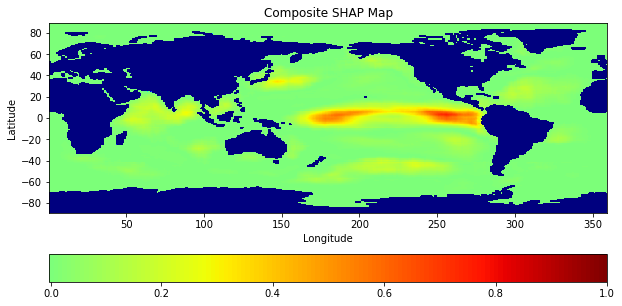

In [41]:
"""Retrieve SHAP composite for True Positive cases"""
SHAP_composite = np.array(ElNino_SHAP).mean(axis=0)

"""Plot Composite SHAP map from list of case SHAP maps"""
plt.figure(figsize=(10,5))
"""Correspondind x/y ticks for the SHAP map"""
xmax, ymax = SHAP_composite.shape[1], SHAP_composite.shape[0]
plt.title(f'Composite SHAP Map')
plt.imshow(SHAP_composite, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
           extent=[lons.min(), lons.max(), lats.min(), lats.max()])
plt.colorbar(orientation='horizontal')
plt.ylabel('Latitude')
plt.xlabel('Longitude')

## PLOT ALL COMPARISON RESULTS

In [ ]:
test_ElNino
ElNino_importance
ElNino_IGs
ElNino_SAs
ElNino_CAMs
ElNino_LRPs
ElNino_SHAP

# choose samples randomly to showcase model performance
smpl_list = [32, 38, 70, 71]
for idx, smpl in enumerate(smpl_list):
    fig, ax = plt.subplots(ncols=7, figsize=(84,9), constrained_layout = True)
    """ ================================================================"""
    """ 1. Raw pattern plot"""
    if idx==0:
        ax[0].set_title('Input SST', fontsize=90, weight='bold')
    sst = test_ElNino[smpl]
    norm = colors.TwoSlopeNorm(vmin=-2.5, vcenter=0., vmax=2.5)
    sst = ax[0].imshow(sst, cmap='RdBu_r', norm=norm, aspect='auto',
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    """ 1.1. Draw nino3.4 ROI -> where the model should look at"""
    h, w = (lats_nino34[-1]-lats_nino34[0]), (lons_nino34[-1]-lons_nino34[0])
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=8, edgecolor='darkblue', facecolor='none')
    # ax[0].add_patch(area_nino34)
    # ax[0].text(minlon-20, maxlat+4,'Nino-3.4 region', color='darkblue', fontsize=24, weight='bold')
    # Setting for label size
    cbar0 = fig.colorbar(sst, ax=ax[0], orientation='horizontal', 
                         label='SST anomaly (Celsius)')
    cbar0.ax.tick_params(labelsize=16)
    
    # plt.figure(figsize=(10,5))
    """ ================================================================"""
    """ 2. Contour pattern plot: """
    if idx==0:
        ax[1].set_title('Ours', fontsize=90, weight='bold')
    """ Compute grid weights from interpretable Neural Additive model"""
    grid_weights = ElNino_importance[smpl]
    norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
    hm = ax[1].imshow(grid_weights, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # Setting for label size
    cbar1 = fig.colorbar(hm, ax=ax[1], orientation='horizontal', 
                         label='pixel weight')
    cbar1.ax.tick_params(labelsize=12)
    """ 2.1. Draw nino3.4 ROI -> where the model should look at"""
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=10, edgecolor='black', facecolor='none')
    ax[1].add_patch(area_nino34)
    ax[1].text(minlon-30, maxlat-35,'Nino3.4', color='black', fontsize=60, weight='bold')
    
    # plt.figure(figsize=(10,5))
    """ ================================================================"""
    """ 3. Contour pattern plot: """
    if idx==0:
        ax[2].set_title('IG', fontsize=90, weight='bold')
    """ Compute grid weights from interpretable Neural Additive model"""
    grid_weights = ElNino_IGs[smpl]
    norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
    hm = ax[2].imshow(grid_weights, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # Setting for label size
    cbar1 = fig.colorbar(hm, ax=ax[2], orientation='horizontal', 
                         label='pixel weight')
    cbar1.ax.tick_params(labelsize=12)
    """ 3.1. Draw nino3.4 ROI -> where the model should look at"""
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=10, edgecolor='black', facecolor='none')
    ax[2].add_patch(area_nino34)
    ax[2].text(minlon-30, maxlat-35,'Nino3.4', color='black', fontsize=60, weight='bold')
    
    """ ================================================================"""
    """ 4. Contour pattern plot: """
    if idx==0:
        ax[3].set_title('Attention', fontsize=90, weight='bold')
    """ Compute grid weights from interpretable Neural Additive model"""
    grid_weights = ElNino_SAs[smpl]
    norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
    hm = ax[3].imshow(grid_weights, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # Setting for label size
    cbar1 = fig.colorbar(hm, ax=ax[3], orientation='horizontal', 
                         label='pixel weight')
    cbar1.ax.tick_params(labelsize=12)
    """ 4.1. Draw nino3.4 ROI -> where the model should look at"""
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=10, edgecolor='black', facecolor='none')
    ax[3].add_patch(area_nino34)
    ax[3].text(minlon-30, maxlat-35,'Nino3.4', color='black', fontsize=60, weight='bold')
    
    """ ================================================================"""
    """ 5. Contour pattern plot: """
    if idx==0:
        ax[4].set_title('XGrad-CAM', fontsize=90, weight='bold')
    """ Compute grid weights from interpretable Neural Additive model"""
    grid_weights = ElNino_CAMs[smpl]
    norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
    hm = ax[4].imshow(grid_weights, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # Setting for label size
    cbar1 = fig.colorbar(hm, ax=ax[4], orientation='horizontal', 
                         label='pixel weight')
    cbar1.ax.tick_params(labelsize=12)
    """ 5.1. Draw nino3.4 ROI -> where the model should look at"""
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=10, edgecolor='black', facecolor='none')
    ax[4].add_patch(area_nino34)
    ax[4].text(minlon-30, maxlat-35,'Nino3.4', color='black', fontsize=60, weight='bold')
    
    """ ================================================================"""
    """ 6. Contour pattern plot: """
    if idx==0:
        ax[5].set_title('LRP', fontsize=90, weight='bold')
    """ Compute grid weights from interpretable Neural Additive model"""
    grid_weights = ElNino_LRPs[smpl]
    norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
    hm = ax[5].imshow(grid_weights, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # Setting for label size
    cbar1 = fig.colorbar(hm, ax=ax[5], orientation='horizontal', 
                         label='pixel weight')
    cbar1.ax.tick_params(labelsize=12)
    """ 6.1. Draw nino3.4 ROI -> where the model should look at"""
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=10, edgecolor='black', facecolor='none')
    ax[5].add_patch(area_nino34)
    ax[5].text(minlon-30, maxlat-35,'Nino3.4', color='black', fontsize=60, weight='bold')
    
    """ ================================================================"""
    """ 7. Contour pattern plot: """
    if idx==0:
        ax[6].set_title('DeepSHAP', fontsize=90, weight='bold')
    """ Compute grid weights from interpretable Neural Additive model"""
    grid_weights = ElNino_SHAP[smpl]
    norm = colors.TwoSlopeNorm(vmin=-0.001, vcenter=0., vmax=1)
    hm = ax[6].imshow(grid_weights, norm=norm, cmap='jet', aspect='auto', alpha=1.0,
               extent=[lons.min(), lons.max(), lats.min(), lats.max()])
    # Setting for label size
    cbar1 = fig.colorbar(hm, ax=ax[6], orientation='horizontal', 
                         label='pixel weight')
    cbar1.ax.tick_params(labelsize=12)
    """ 7.1. Draw nino3.4 ROI -> where the model should look at"""
    area_nino34 = patches.Rectangle((minlon, minlat), w, h, linewidth=10, edgecolor='black', facecolor='none')
    ax[6].add_patch(area_nino34)
    ax[6].text(minlon-30, maxlat-35,'Nino3.4', color='black', fontsize=60, weight='bold')
    
    plt.show()